# Imports and installations

In [ ]:
!pip install catboost
!pip install shap
!pip install flaml
!pip install optuna
!pip install mlxtend

In [ ]:
# Standard library imports
import ast
import six
import sys

In [ ]:
# Third-party imports
import sys
import joblib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import shap
import optuna
from optuna.samplers import TPESampler
from sklearn.base import clone
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.ensemble import (AdaBoostClassifier, RandomForestClassifier,
                              RandomForestRegressor, StackingClassifier)
from sklearn.experimental import enable_iterative_imputer
from sklearn.feature_selection import RFECV
from sklearn.impute import IterativeImputer, KNNImputer, SimpleImputer
from sklearn.linear_model import (LinearRegression, LogisticRegression,
                                  LogisticRegressionCV, SGDClassifier)
from sklearn.metrics import (accuracy_score, classification_report,
                             confusion_matrix, f1_score, precision_score,
                             recall_score, roc_auc_score, r2_score,
                             matthews_corrcoef, average_precision_score,
                             roc_curve)
from sklearn.model_selection import (GridSearchCV, KFold, ShuffleSplit,
                                     cross_val_score, cross_validate,
                                     train_test_split, StratifiedKFold)
from sklearn.compose import ColumnTransformer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import (LabelEncoder, OneHotEncoder,
                                   RobustScaler, StandardScaler)
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier, Pool, EShapCalcType, EFeaturesSelectionAlgorithm
import catboost as cb
from flaml import AutoML
import lightgbm as lgb
from mlxtend.feature_selection import (SequentialFeatureSelector as SFS)
from mlxtend.plotting import (plot_sequential_feature_selection as plot_sfs)

# Fixing joblib import issue
sys.modules['sklearn.externals.joblib'] = joblib

In [ ]:
# ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# set pandas display options
pd.set_option('display.max_rows', 60)
pd.set_option('display.max_columns', 30)

In [ ]:
pd.set_option('display.precision', 3)

In [ ]:
random_state=1

In [ ]:
joblib.__version__

'1.4.2'

In [ ]:
from shap.utils import format_value
from shap.plots import colors
from shap.plots._labels import labels
import matplotlib
def waterfall(shap_values, max_display=10, show=True):
    # Turn off interactive plot
    if show is False:
        plt.ioff()

    # make sure the input is an Explanation object
    if not isinstance(shap_values, shap.Explanation):
        emsg = (
            "The waterfall plot requires an `Explanation` object as the "
            "`shap_values` argument."
        )
        raise TypeError(emsg)

    # make sure we only have a single explanation to plot
    sv_shape = shap_values.shape
    if len(sv_shape) != 1:
        emsg = (
            "The waterfall plot can currently only plot a single explanation, but a "
            f"matrix of explanations (shape {sv_shape}) was passed! Perhaps try "
            "`shap.plots.waterfall(shap_values[0])` or for multi-output models, "
            "try `shap.plots.waterfall(shap_values[0, 0])`."
        )
        raise ValueError(emsg)

    base_values = float(shap_values.base_values)
    features = shap_values.display_data if shap_values.display_data is not None else shap_values.data
    feature_names = shap_values.feature_names
    lower_bounds = getattr(shap_values, "lower_bounds", None)
    upper_bounds = getattr(shap_values, "upper_bounds", None)
    values = shap_values.values
    #values = []

    # unwrap pandas series
    if isinstance(features, pd.Series):
        if feature_names is None:
            feature_names = list(features.index)
        features = features.values

    # fallback feature names
    if feature_names is None:
        feature_names = np.array([labels['FEATURE'] % str(i) for i in range(len(values))])

    # init variables we use for tracking the plot locations
    num_features = min(max_display, len(values))
    row_height = 0.5
    rng = range(num_features - 1, -1, -1)
    order = np.argsort(-np.abs(values))
    pos_lefts = []
    pos_inds = []
    pos_widths = []
    pos_low = []
    pos_high = []
    neg_lefts = []
    neg_inds = []
    neg_widths = []
    neg_low = []
    neg_high = []
    loc = base_values + values.sum()
    yticklabels = ["" for _ in range(num_features + 1)]

    # size the plot based on how many features we are plotting
    plt.gcf().set_size_inches(8, num_features * row_height + 1.5)

    # see how many individual (vs. grouped at the end) features we are plotting
    if num_features == len(values):
        num_individual = num_features
    else:
        num_individual = num_features - 1

    # compute the locations of the individual features and plot the dashed connecting lines
    for i in range(num_individual):
        sval = values[order[i]]
        loc -= sval
        if sval >= 0:
            pos_inds.append(rng[i])
            pos_widths.append(sval)
            if lower_bounds is not None:
                pos_low.append(lower_bounds[order[i]])
                pos_high.append(upper_bounds[order[i]])
            pos_lefts.append(loc)
        else:
            neg_inds.append(rng[i])
            neg_widths.append(sval)
            if lower_bounds is not None:
                neg_low.append(lower_bounds[order[i]])
                neg_high.append(upper_bounds[order[i]])
            neg_lefts.append(loc)
        if num_individual != num_features or i + 4 < num_individual:
            plt.plot([loc, loc], [rng[i] - 1 - 0.4, rng[i] + 0.4],
                     color="#bbbbbb", linestyle="--", linewidth=0.5, zorder=-1)
        if features is None:
            yticklabels[rng[i]] = feature_names[order[i]]
        else:
            if np.issubdtype(type(features[order[i]]), np.number):
                yticklabels[rng[i]] = shap.utils.format_value(float(features[order[i]]), "%0.02f") + " = " + feature_names[order[i]]
            else:
                yticklabels[rng[i]] = str(features[order[i]]) + " = " + str(feature_names[order[i]])

    # add a last grouped feature to represent the impact of all the features we didn't show
    if num_features < len(values):
        yticklabels[0] = "%d other features" % (len(values) - num_features + 1)
        remaining_impact = base_values - loc
        if remaining_impact < 0:
            pos_inds.append(0)
            pos_widths.append(-remaining_impact)
            pos_lefts.append(loc + remaining_impact)
        else:
            neg_inds.append(0)
            neg_widths.append(-remaining_impact)
            neg_lefts.append(loc + remaining_impact)

    points = pos_lefts + list(np.array(pos_lefts) + np.array(pos_widths)) + neg_lefts + \
        list(np.array(neg_lefts) + np.array(neg_widths))
    dataw = np.max(points) - np.min(points)

    # draw invisible bars just for sizing the axes
    label_padding = np.array([0.1*dataw if w < 1 else 0 for w in pos_widths])
    plt.barh(pos_inds, np.array(pos_widths) + label_padding + 0.02*dataw,
             left=np.array(pos_lefts) - 0.01*dataw, color=colors.red_rgb, alpha=0)
    label_padding = np.array([-0.1*dataw if -w < 1 else 0 for w in neg_widths])
    plt.barh(neg_inds, np.array(neg_widths) + label_padding - 0.02*dataw,
             left=np.array(neg_lefts) + 0.01*dataw, color=colors.blue_rgb, alpha=0)

    # define variable we need for plotting the arrows
    head_length = 0.08
    bar_width = 0.8
    xlen = plt.xlim()[1] - plt.xlim()[0]
    fig = plt.gcf()
    ax = plt.gca()
    bbox = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    width = bbox.width
    bbox_to_xscale = xlen/width
    hl_scaled = bbox_to_xscale * head_length
    renderer = fig.canvas.get_renderer()

    # draw the positive arrows
    for i in range(len(pos_inds)):
        dist = pos_widths[i]
        arrow_color = colors.red_rgb # if round(dist,2) != 0 else "#cccccc"  # Change color to grey if value is zero
        dist = dist #if round(dist,2) != 0 else 0
        arrow_obj = plt.arrow(
            pos_lefts[i], pos_inds[i], max(dist-hl_scaled, 0.000001), 0,
            head_length=min(dist, hl_scaled),
            color=arrow_color, width=bar_width,
            head_width=bar_width,
        )

        if pos_low is not None and i < len(pos_low):
            plt.errorbar(
                pos_lefts[i] + pos_widths[i], pos_inds[i],
                xerr=np.array([[pos_widths[i] - pos_low[i]], [pos_high[i] - pos_widths[i]]]),
                ecolor=colors.light_red_rgb,
            )

        if True:#round(pos_widths[i],2) > 0:
          text_color = colors.red_rgb
          format_text_value = '%+0.03f'
        else:
          text_color = "#cccccc"
          format_text_value = '%0.02f'

        txt_obj = plt.text(
            pos_lefts[i] + 0.5*dist, pos_inds[i], format_value(pos_widths[i], format_text_value),
            horizontalalignment='center', verticalalignment='center', color="white",
            fontsize=12,
        )
        text_bbox = txt_obj.get_window_extent(renderer=renderer)
        arrow_bbox = arrow_obj.get_window_extent(renderer=renderer)

        # if the text overflows the arrow then draw it after the arrow
        if text_bbox.width > arrow_bbox.width:
            txt_obj.remove()

            if True:#round(pos_widths[i],2) > 0:
              text_color = colors.red_rgb
              format_text_value = '%+0.03f'
            else:
              text_color = "#cccccc"
              format_text_value = '%0.02f'

            txt_obj = plt.text(
              pos_lefts[i] + (5/72)*bbox_to_xscale + dist, pos_inds[i], format_value(pos_widths[i], format_text_value),
              horizontalalignment='left', verticalalignment='center', color=text_color,
              fontsize=12,
            )


    # draw the negative arrows
    for i in range(len(neg_inds)):
        dist = neg_widths[i]
        arrow_color = colors.blue_rgb# if round(dist,2) != 0 else "#cccccc"  # Change color to grey if value is zero
        dist = dist# if round(dist,2) != 0 else 0
        arrow_obj = plt.arrow(
            neg_lefts[i], neg_inds[i], -max(-dist-hl_scaled, 0.000001), 0,
            head_length=min(-dist, hl_scaled),
            color=arrow_color, width=bar_width,
            head_width=bar_width,
        )

        if neg_low is not None and i < len(neg_low):
            plt.errorbar(
                neg_lefts[i] + neg_widths[i], neg_inds[i],
                xerr=np.array([[neg_widths[i] - neg_low[i]], [neg_high[i] - neg_widths[i]]]),
                ecolor=colors.light_blue_rgb,
            )
        if True:#np.abs(round(neg_widths[i],2)) > 0:
          text_color = colors.blue_rgb
          format_text_value = '%-0.03f'
        else:
          text_color = "#cccccc"
          format_text_value = '%0.02f'

        txt_obj = plt.text(
            neg_lefts[i] + 0.5*dist, neg_inds[i], format_value(neg_widths[i], format_text_value),
            horizontalalignment='center', verticalalignment='center', color="white",
            fontsize=12,
        )
        text_bbox = txt_obj.get_window_extent(renderer=renderer)
        arrow_bbox = arrow_obj.get_window_extent(renderer=renderer)
        # if the text overflows the arrow then draw it after the arrow
        if text_bbox.width > arrow_bbox.width:
            txt_obj.remove()

            if True:#np.abs(round(neg_widths[i],2)) > 0:
              text_color = colors.blue_rgb
              format_text_value = '%-0.03f'
            else:
              text_color = "#cccccc"
              format_text_value = '%0.03f'

            txt_obj = plt.text(
              neg_lefts[i] - (5/72)*bbox_to_xscale + dist, neg_inds[i], format_value(neg_widths[i],format_text_value),
              horizontalalignment='right', verticalalignment='center', color=text_color,
              fontsize=12,
              )

    # draw the y-ticks twice, once in gray and then again with just the feature names in black
    # The 1e-8 is so matplotlib 3.3 doesn't try and collapse the ticks
    ytick_pos = list(range(num_features)) + list(np.arange(num_features)+1e-8)
    plt.yticks(ytick_pos, yticklabels[:-1] + [label.split('=')[-1] for label in yticklabels[:-1]], fontsize=13)

    # put horizontal lines for each feature row
    for i in range(num_features):
        plt.axhline(i, color="#cccccc", lw=0.5, dashes=(1, 5), zorder=-1)

    # mark the prior expected value and the model prediction
    plt.axvline(base_values, 0, 1/num_features, color="#bbbbbb", linestyle="--", linewidth=0.5, zorder=-1)
    fx = base_values + values.sum()
    plt.axvline(fx, 0, 1, color="#bbbbbb", linestyle="--", linewidth=0.5, zorder=-1)

    # clean up the main axis
    plt.gca().xaxis.set_ticks_position('bottom')
    plt.gca().yaxis.set_ticks_position('none')
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['left'].set_visible(False)
    ax.tick_params(labelsize=13)
    #plt.xlabel("\nModel output", fontsize=12)

    # draw the E[f(X)] tick mark
    xmin, xmax = ax.get_xlim()
    ax2 = ax.twiny()
    ax2.set_xlim(xmin, xmax)
    ax2.set_xticks([base_values, base_values+1e-8])  # The 1e-8 is so matplotlib 3.3 doesn't try and collapse the ticks
    ax2.set_xticklabels(["\n$E[f(X)]$", "\n$ = "+format_value(base_values, "%0.03f")+"$"], fontsize=12, ha="left")
    ax2.spines['right'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    ax2.spines['left'].set_visible(False)

    # draw the f(x) tick mark
    ax3 = ax2.twiny()
    ax3.set_xlim(xmin, xmax)
    # The 1e-8 is so matplotlib 3.3 doesn't try and collapse the ticks
    ax3.set_xticks([base_values + values.sum(), base_values + values.sum() + 1e-8])
    ax3.set_xticklabels(["$f(x)$", "$ = "+format_value(fx, "%0.03f")+"$"], fontsize=12, ha="left")
    tick_labels = ax3.xaxis.get_majorticklabels()
    tick_labels[0].set_transform(tick_labels[0].get_transform(
    ) + matplotlib.transforms.ScaledTranslation(-10/72., 0, fig.dpi_scale_trans))
    tick_labels[1].set_transform(tick_labels[1].get_transform(
    ) + matplotlib.transforms.ScaledTranslation(12/72., 0, fig.dpi_scale_trans))
    tick_labels[1].set_color("#999999")
    ax3.spines['right'].set_visible(False)
    ax3.spines['top'].set_visible(False)
    ax3.spines['left'].set_visible(False)

    # adjust the position of the E[f(X)] = x.xx label
    tick_labels = ax2.xaxis.get_majorticklabels()
    tick_labels[0].set_transform(tick_labels[0].get_transform(
    ) + matplotlib.transforms.ScaledTranslation(-20/72., 0, fig.dpi_scale_trans))
    tick_labels[1].set_transform(tick_labels[1].get_transform(
    ) + matplotlib.transforms.ScaledTranslation(22/72., -1/72., fig.dpi_scale_trans))

    tick_labels[1].set_color("#999999")

    # color the y tick labels that have the feature values as gray
    # (these fall behind the black ones with just the feature name)
    tick_labels = ax.yaxis.get_majorticklabels()
    for i in range(num_features):
        tick_labels[i].set_color("#999999")

    if show:
        plt.show()
    else:
        return plt.gca()

# Download and preprocess data

In [ ]:
df = pd.read_excel('/content/drive/MyDrive/Raw data/genetics_new_point.xlsx', index_col=0, header=0).reset_index(drop=True)

In [ ]:
column_mapping = {
        'Пол': 'Gender',
        'Возраст': 'Age',
        'ИМТ': 'BMI',
        'систол. АД': 'Systolic BP',
        'ЧСС': 'Heart Rate',
        'Давность болевого синдрома': 'Duration of Pain',
        'Cегмент ST': 'ST Segment',
        'Передняя стенка ЛЖ': 'Anterior LV Wall',
        'Боковая  стенка ЛЖ': 'Lateral LV Wall',
        'Класс Killip': 'Killip Class',
        #'Риск GRACE, баллы': 'GRACE Risk Score',
        'пост-ИМ': 'Post-MI',
        'пост-ОНМК': 'Post-Stroke',
        'пост-стент/АКШ': 'Post-Stent',
        'ФП': 'Atrial Fibrillation',
        'ГБ': 'Hypertension',
        'СД': 'Diabetes',
        'МФА': 'Atherosclerosis',
        #'Ожирение, степень': 'Obesity',
        #'Анемия, степень': 'Anemia',
        'Индекс коморбидности по Charlson': 'Comorbidity Index',
        'Отягощенный анамнез': 'History',
        'TnT-ПО, нг/л': 'TnT PO',
        'Хсобщ, ммоль/л': 'Total Cholesterol',
        #'ТГц, ммоль/л': 'Triglycerides',
        'Гемоглобин, г/л': 'Hemoglobin',
        'Глюкоза, ммоль/л': 'Glucose',
        'СКФ EPI': 'eGFR EPI',
        'Креатинин, мкмоль/л': 'Creatinine',
        'иКДО ЛЖ': 'LV EDV',
        'иКСО ЛЖ': 'LV ESV',
        'ФВ ЛЖ': 'LV EF',
        'иММ ЛЖ': 'LV Mass',
        'ЛП': 'Left Atrium',
        'ИНЛС ЛЖ': 'LV Infarct Size',
        'TIMI в ИЗА': 'TIMI Grade in Infarct-Related Artery',
        'Инфаркт-зависимая артерия': 'Infarct-Related Artery',
        'Поражение СТВОЛА ЛКА': 'Left Main Coronary Artery Lesion',
        'Поражение коронарных артерий': 'Coronary Artery Lesion',
        'ЧКВ-1/АКШ-2': 'PCI or CABG',
        #'Низая - 1 Высокая - 2': 'Statins',
        'P2Y12-интибитор': 'P2Y12 inhibitor',
        #'VGFR2': 'VGFR2',
        # 'CYP2C19*2': 'CYP2C19_2',
        # 'CYP2C19*3': 'CYP2C19_3',
        # 'CYP2C19*17': 'CYP2C19_17',
        'Любой CYP2C19': 'All Negative CYP2C19',
        'combined_new_point': 'combined',
        'Покрытие стентов BMS-1 / DES-2': 'BMS or DES'
    }
df = df[list(column_mapping.keys())].rename(columns=column_mapping)

In [ ]:
numerical = sorted(['Age', 'BMI', 'Creatinine', 'Glucose', 'Heart Rate', 'Hemoglobin', 'LV EDV', 'LV EF', 'LV ESV', 'LV Mass', 'Left Atrium', 'Systolic BP', 'TnT PO', 'Total Cholesterol', 'eGFR EPI','LV Infarct Size'])
binary = sorted(['Anterior LV Wall', 'Lateral LV Wall','PCI or CABG','BMS or DES','ST Segment','All Negative CYP2C19','P2Y12 inhibitor'])
categorical = sorted(['Comorbidity Index', 'Duration of Pain', 'Killip Class','TIMI Grade in Infarct-Related Artery', 'Infarct-Related Artery', 'Left Main Coronary Artery Lesion', 'Coronary Artery Lesion'])#,'CYP2C19_2','CYP2C19_3','CYP2C19_17'])

In [ ]:
df.at[100,'BMI'] = 70/(1.76**2)
df.at[2,'BMI'] = 59/(1.64**2)
df.at[168,'Glucose'] = 4.96
df.at[137,'eGFR EPI'] = 101.4

In [ ]:
df = df[sorted(df.columns.values)]
not_use = ['combined']
X_train, X_test, y_train, y_test = train_test_split(df.drop(not_use,axis = 1).copy(), df[not_use].copy(), test_size=0.25, random_state=random_state)

In [ ]:
X_train.isna().sum().sum(),X_test.isna().sum().sum()

(43, 17)

In [ ]:
print(X_train.columns[(X_train.isna().sum()/len(X_train) > 0.2).values])
print(df.columns[(df.isna().sum()/len(df) > 0.2).values])

Index([], dtype='object')
Index([], dtype='object')


In [ ]:
X_train.shape, X_test.shape

((163, 39), (55, 39))

In [ ]:
new_markers = ['CYP2C19_2','CYP2C19_3','CYP2C19_17','All Negative CYP2C19']
new_cols = sorted(X_test.columns)

In [ ]:
from scipy import stats
def detect_numerical_outliers(df, cols, z_thresh=3):
    # Copy the dataframe to avoid changes to the original data
    outliers = pd.DataFrame()
    for col in cols:
        if df[col].isnull().sum()/len(df) < 0.5:  # Skip columns with more than 50% missing values
            df[col].fillna(df[col].median(), inplace=True)
            z_scores = np.abs(stats.zscore(df[col]))
            outliers[col] = (z_scores > z_thresh)
    return outliers

In [ ]:
def detect_categorical_outliers(df, cols, threshold=0.01):
    outliers = pd.DataFrame()
    for col in cols:
        frequencies = df[col].value_counts(normalize=True)
        rare_categories = frequencies[frequencies < threshold].index
        outliers[col] = df[col].isin(rare_categories)
    return outliers

In [ ]:
# Example usage
numerical_outliers = detect_numerical_outliers(df, numerical)
categorical_outliers = detect_categorical_outliers(df, [categorical + binary])

# Combine the outlier information
outliers = pd.concat([numerical_outliers, categorical_outliers], axis=1)

In [ ]:
for col in categorical:
  res = df[col][categorical_outliers[col]]
  if len(res) > 0:
    print(res)

## Imputation

In [ ]:
f = 0
for i in numerical + binary + categorical:
  if i not in X_test.columns:
    print(i)
    f=1
if f == 1:
  raise Exception('Not assigned column type')

In [ ]:
X_train.loc[:,sorted(categorical + binary)] = X_train[sorted(categorical + binary)].fillna(-1).astype(int)
X_test.loc[:,sorted(categorical + binary)] = X_test[sorted(categorical + binary)].fillna(-1).astype(int)

In [ ]:
X_train.loc[:,sorted(categorical + binary)] = X_train.loc[:,sorted(categorical + binary)].astype(int)
X_test.loc[:,sorted(categorical + binary)] = X_test.loc[:,sorted(categorical + binary)].astype(int)

In [ ]:
def mice_impute_data(data_imputers_train,data_imputers_test,numerical = numerical,categorical = categorical,binary = binary):

    # Separate the data into numerical, categorical, and binary columns
    numerical_cols = numerical
    categorical_cols = categorical
    binary_cols = binary
    non_numerical = sorted(categorical_cols + binary_cols)

    #data_imputers_train['LV Infarct Size'] = data_imputers_train['LV Infarct Size'].fillna(data_imputers_train['LV Infarct Size'].max())

    nums = [data_imputers_train.columns.get_loc(numerical[x]) for x in range(len(numerical))]


    # Impute numerical columns using linear regression
    imputer_num = IterativeImputer(estimator=LinearRegression(),max_iter=100, skip_complete=True)
    data_imputers_train.loc[:,numerical_cols] = imputer_num.fit_transform(data_imputers_train)[:,nums]
    data_imputers_test.loc[:,numerical_cols] = imputer_num.transform(data_imputers_test)[:,nums]

    #data_imputers_train[binary_cols + categorical_cols] = data_imputers_train[binary_cols + categorical_cols].fillna(-1).astype(int)
    #data_imputers_test[binary_cols + categorical_cols] = data_imputers_test[binary_cols + categorical_cols].fillna(-1).astype(int)
    cat = [data_imputers_train.columns.get_loc((non_numerical)[x]) for x in range(len((non_numerical)))]
    # Impute binary columns using logistic regression
    imputer_bin = IterativeImputer(estimator=LogisticRegression(solver='liblinear'), max_iter=100, skip_complete=True, missing_values=-1)
    # data_imputers_train[data_imputers_train.columns] = imputer_bin.fit_transform(data_imputers_train)
    # data_imputers_test[data_imputers_test.columns] = imputer_bin.transform(data_imputers_test)
    data_imputers_train.loc[:,non_numerical] = imputer_bin.fit_transform(data_imputers_train)[:,cat]
    data_imputers_test.loc[:,non_numerical] = imputer_bin.transform(data_imputers_test)[:,cat]

    return data_imputers_train,data_imputers_test

# Example usage
imputed_train, imputed_test = mice_impute_data(X_train.copy(), X_test.copy())
imputed_train.isna().sum().sum()
print(f"Total number of nan values: {imputed_train.isna().sum().sum()}")

Total number of nan values: 0


In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import ks_2samp
from scipy.stats import chi2_contingency

def check_distribution_shift(df1, df2, numerical = numerical):
    """
    Check for distribution shift between two dataframes using the Kolmogorov-Smirnov test for each variable.

    Args:
        df1 (pandas.DataFrame): First dataframe.
        df2 (pandas.DataFrame): Second dataframe.

    Returns:
        dict: Dictionary with variable names as keys and True/False indicating distribution shift.
    """
    variables = set(df1.columns).intersection(df2.columns)
    shift_results = {}

    for variable in variables:
        data1 = df1[variable].values
        data2 = df2[variable].values
        stat, p_value = ks_2samp(data1, data2)

        # Check significance level (commonly set to 0.05)
        alpha = 0.01

        # If p-value is less than the significance level, distribution shift is detected
        if p_value < alpha:
            shift_results[variable] = True
        else:
            shift_results[variable] = False

    return shift_results


shift_results = check_distribution_shift(imputed_train.dropna(),X_train)

for variable, is_shift in shift_results.items():
  if is_shift == True:
    print(f"Distribution shift detected for {variable}: {is_shift}")

if True not in shift_results.values():
  print("Distribution shift not detected.")

Distribution shift not detected.


In [ ]:
from plotly.figure_factory import create_distplot

In [ ]:
variables = [imputed_train['LV Infarct Size'], X_train.dropna()['LV Infarct Size']]
labels = ['Imputed', 'Original']
fig = create_distplot(variables, labels, show_hist=False)
fig.show()

In [ ]:
X_train = imputed_train[sorted(imputed_train.columns)]
X_test = imputed_test[sorted(imputed_train.columns)]
y_train = y_train['combined']
y_test = y_test['combined']

In [ ]:
cat_features = sorted(binary + categorical)
X_train[cat_features] = X_train[cat_features].astype(int)
X_test[cat_features] = X_test[cat_features].astype(int)

In [ ]:
X_train[X_train == -1].sum().sum()

0.0

In [ ]:
X_test[X_test == -1].sum().sum()

0.0

# AutoML baseline

In [ ]:
baseline_model = AutoML()

settings = {
    "metric": 'roc_auc',
    #"estimator_list": ['lgbm','catboost', 'rf'], # list of ML learners
    "task": 'classification', # task type
    #"log_file_name": '/content/drive/MyDrive/1231_ABCD/baseline_model_genetics_cyp.log',  # flaml log file
    #"time_budget": 2000,
    'max_iter': 150,
    "early_stop": True,
    "eval_method": "cv",
    "n_splits": 5,
    #"verbose":2,
    "seed":random_state,
    "split_type":"stratified"

}

In [ ]:
baseline_model.fit(X_train,y_train,**settings)

[flaml.automl.logger: 06-26 11:29:54] {1680} INFO - task = classification
[flaml.automl.logger: 06-26 11:29:54] {1691} INFO - Evaluation method: cv
[flaml.automl.logger: 06-26 11:29:54] {1789} INFO - Minimizing error metric: 1-roc_auc
[flaml.automl.logger: 06-26 11:29:54] {1901} INFO - List of ML learners in AutoML Run: ['lgbm', 'rf', 'catboost', 'xgboost', 'extra_tree', 'xgb_limitdepth', 'lrl1']
[flaml.automl.logger: 06-26 11:29:54] {2219} INFO - iteration 0, current learner lgbm
[flaml.automl.logger: 06-26 11:29:54] {2345} INFO - Estimated sufficient time budget=10000s. Estimated necessary time budget=10s.
[flaml.automl.logger: 06-26 11:29:54] {2392} INFO -  at 0.5s,	estimator lgbm's best error=0.2703,	best estimator lgbm's best error=0.2703
[flaml.automl.logger: 06-26 11:29:54] {2219} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 06-26 11:29:55] {2392} INFO -  at 0.7s,	estimator lgbm's best error=0.2191,	best estimator lgbm's best error=0.2191
[flaml.automl.logger: 

INFO:flaml.tune.searcher.blendsearch:No low-cost partial config given to the search algorithm. For cost-frugal search, consider providing low-cost values for cost-related hps via 'low_cost_partial_config'. More info can be found at https://microsoft.github.io/FLAML/docs/FAQ#about-low_cost_partial_config-in-tune


[flaml.automl.logger: 06-26 11:30:07] {2392} INFO -  at 13.0s,	estimator lrl1's best error=0.3626,	best estimator xgb_limitdepth's best error=0.2163
[flaml.automl.logger: 06-26 11:30:07] {2219} INFO - iteration 24, current learner lrl1
[flaml.automl.logger: 06-26 11:30:07] {2392} INFO -  at 13.2s,	estimator lrl1's best error=0.3626,	best estimator xgb_limitdepth's best error=0.2163
[flaml.automl.logger: 06-26 11:30:07] {2219} INFO - iteration 25, current learner rf
[flaml.automl.logger: 06-26 11:30:08] {2392} INFO -  at 13.6s,	estimator rf's best error=0.2619,	best estimator xgb_limitdepth's best error=0.2163
[flaml.automl.logger: 06-26 11:30:08] {2219} INFO - iteration 26, current learner xgboost
[flaml.automl.logger: 06-26 11:30:08] {2392} INFO -  at 14.0s,	estimator xgboost's best error=0.2419,	best estimator xgb_limitdepth's best error=0.2163
[flaml.automl.logger: 06-26 11:30:08] {2219} INFO - iteration 27, current learner lrl1
[flaml.automl.logger: 06-26 11:30:08] {2392} INFO -  a

In [ ]:
# @title
# Saving model
joblib.dump(baseline_model, '/content/drive/MyDrive/1231_ABCD/baseline_genetics_cyp.pkl')

['/content/drive/MyDrive/1231_ABCD/baseline_genetics_cyp.pkl']

## Results

In [ ]:
classifiers_predictions = {
    'AutoML baseline' : baseline_model.predict(X_test)
}
classifiers_results = pd.DataFrame(columns=['PR_AUC', 'ROC_AUC', 'F1-score', 'Precision', 'Recall', 'MCC', 'Accuracy'])

for method,pred in classifiers_predictions.items():
    pred_ = pred.round()
    classifiers_results.loc[method]= [round(average_precision_score(y_test,pred_),3),
                         round(roc_auc_score(y_test,pred),3),
                          round(f1_score(y_test,pred_),3),
                          round(precision_score(y_test,pred_),3),
                          round(recall_score(np.asarray(y_test.values),pred_),3),
                          round(matthews_corrcoef(np.asarray(y_test.values),pred_),3),
                          np.round(accuracy_score(y_test,pred_),decimals=4)]
classifiers_results.sort_values(by=['ROC_AUC','PR_AUC'],ascending=False)

,PR_AUC,ROC_AUC,F1-score,Precision,Recall,MCC,Accuracy
AutoML baseline,0.536,0.609,0.645,0.556,0.769,0.228,0.6


In [ ]:
baseline_model.best_estimator

'lgbm'

In [ ]:
baseline_model.best_result

{'pred_time': 9.909755352771645e-05,
 'wall_clock_time': 15.300278902053833,
 'metric_for_logging': {'pred_time': 9.909755352771645e-05},
 'val_loss': 0.17648148148148152,
 'training_iteration': 1,
 'config': {'n_estimators': 4,
  'num_leaves': 4,
  'min_child_samples': 12,
  'learning_rate': 0.5847423249151432,
  'log_max_bin': 7,
  'colsample_bytree': 0.8570267231649611,
  'reg_alpha': 0.0016817916508083605,
  'reg_lambda': 0.5250000942289542},
 'config/n_estimators': 4,
 'config/num_leaves': 4,
 'config/min_child_samples': 12,
 'config/learning_rate': 0.5847423249151432,
 'config/log_max_bin': 7,
 'config/colsample_bytree': 0.8570267231649611,
 'config/reg_alpha': 0.0016817916508083605,
 'config/reg_lambda': 0.5250000942289542,
 'experiment_tag': 'exp',
 'time_total_s': 0.14175844192504883}

In [ ]:
1 - baseline_model.best_loss

0.8235185185185185

<Axes: >

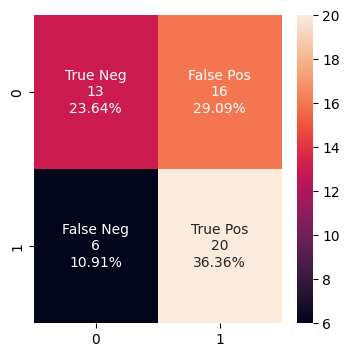

In [ ]:
group_names = ['True Neg','False Pos','False Neg','True Pos']
cf_matrix_cb = confusion_matrix(y_test,baseline_model.predict(X_test))
group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix_cb.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix_cb.flatten()/np.sum(cf_matrix_cb)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
f, ax = plt.subplots(figsize=(4, 4))
sns.heatmap(cf_matrix_cb, annot=labels, fmt='')

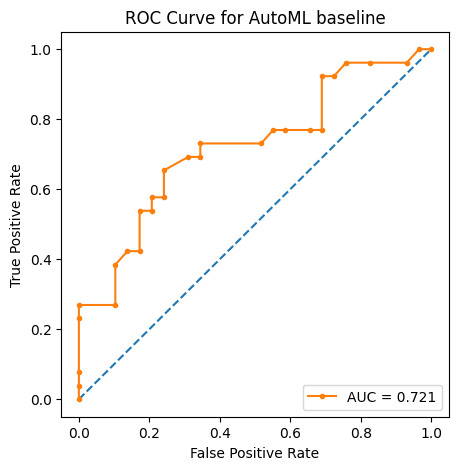

In [ ]:
false_pos_rate, true_pos_rate, proba = roc_curve(y_test, baseline_model.predict_proba(X_test)[:,1])
f, ax = plt.subplots(figsize=(5, 5))
plt.plot([0,1], [0,1], linestyle="--") # plot random curve
plt.plot(false_pos_rate, true_pos_rate, marker=".", label=f"AUC = {roc_auc_score(y_test, baseline_model.predict_proba(X_test)[:,1]):.3f}")
plt.title("ROC Curve for AutoML baseline")
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.legend(loc="lower right")

<Axes: >

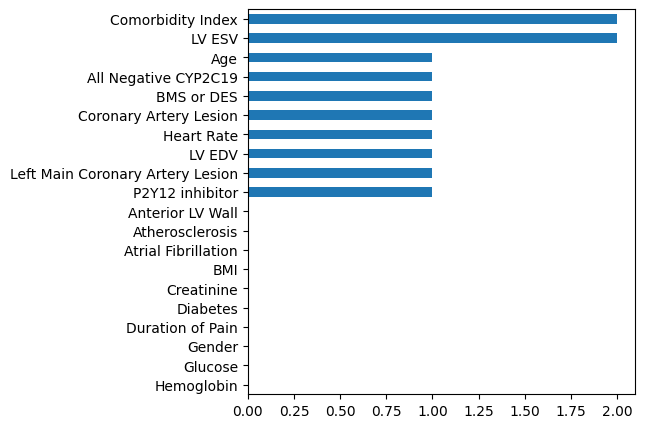

In [ ]:
fig, ax = plt.subplots(figsize=(5,5))
(pd.Series(baseline_model.feature_importances_, index=X_train.columns)
   .nlargest(20)[::-1]
   .plot(kind='barh'))

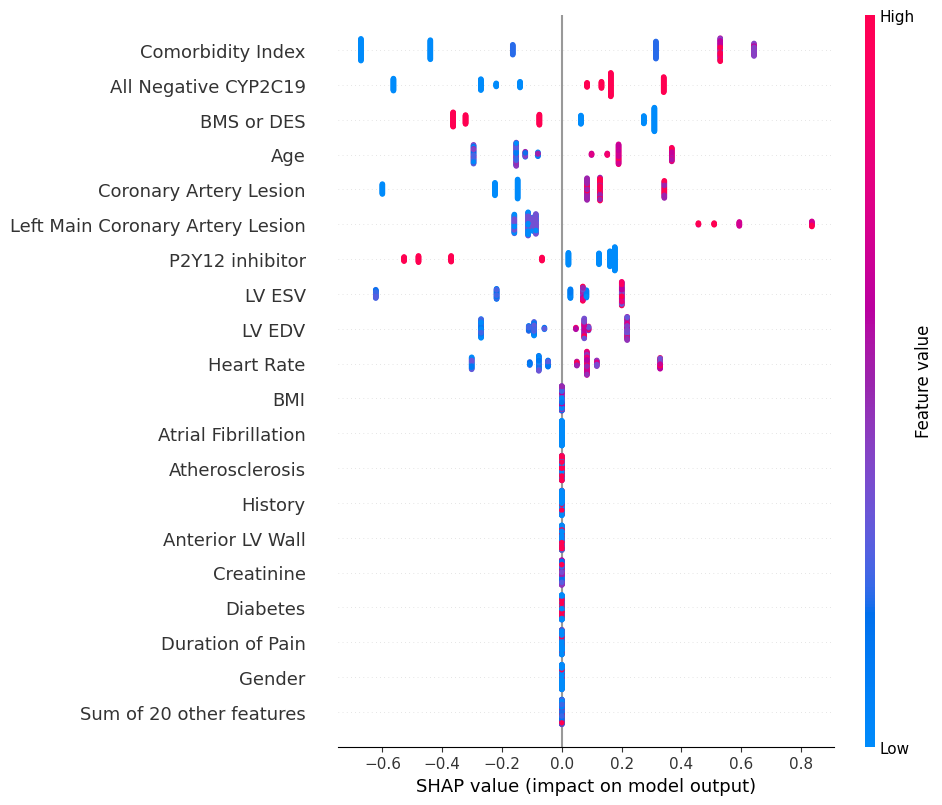

In [ ]:
explainer = shap.Explainer(baseline_model.model.estimator)
shap_values = explainer.shap_values(X_train)
shap.plots.beeswarm(explainer(X_train),max_display=20)

# LightGBM

In [ ]:
def objective(trial):

    params = {
        'objective': 'binary',
        'metric': 'auc',
        'verbosity': -1,
        'boosting_type': 'gbdt',
        'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-8, 10.0),
        'reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-8, 10.0),
        'num_leaves': trial.suggest_int('num_leaves', 2, 10),
        'max_depth': trial.suggest_int('max_depth', 2, 8),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 0.1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1.0),
        'n_estimators': 1000,  # Фиксированное количество деревьев
        'random_state': random_state,
        'early_stopping_round': 100  # Ранний останов для предотвращения переобучения
    }

    cv_results = lgb.cv(
          params,
          lgb.Dataset(X_train, label=y_train),
          num_boost_round=1000,
          nfold=5,
          stratified=True,
          #verbose_eval=False,
          metrics='auc',
          seed = random_state
      )

    auc_mean = cv_results['valid auc-mean'][-1]

    return auc_mean

In [ ]:
sampler = optuna.samplers.TPESampler(seed = random_state)
study = optuna.create_study(study_name="catboost_genetics", direction="maximize",sampler = sampler)

study.optimize(objective, n_trials=150)

[I 2024-06-26 12:15:04,096] A new study created in memory with name: catboost_genetics
[I 2024-06-26 12:15:04,249] Trial 0 finished with value: 0.7503174603174603 and parameters: {'reg_alpha': 5.6649755830282306e-05, 'reg_lambda': 0.030403280126677572, 'num_leaves': 2, 'max_depth': 4, 'min_child_samples': 19, 'learning_rate': 0.00018924123965722266, 'colsample_bytree': 0.4303821479643696}. Best is trial 0 with value: 0.7503174603174603.
[I 2024-06-26 12:15:04,301] Trial 1 finished with value: 0.5 and parameters: {'reg_alpha': 1.2883876209377052e-05, 'reg_lambda': 3.72312200494449e-05, 'num_leaves': 6, 'max_depth': 4, 'min_child_samples': 70, 'learning_rate': 0.00041054120168588934, 'colsample_bytree': 0.9146822054736616}. Best is trial 0 with value: 0.7503174603174603.
[I 2024-06-26 12:15:04,428] Trial 2 finished with value: 0.706957671957672 and parameters: {'reg_alpha': 1.763958399884789e-08, 'reg_lambda': 0.010819509974097813, 'num_leaves': 5, 'max_depth': 5, 'min_child_samples': 18

In [ ]:
best_params = study.best_params
best_score = study.best_value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {best_params}\n")

Best score: 0.8214285714285714

Optimized parameters: {'reg_alpha': 1.302644442327214e-08, 'reg_lambda': 0.0016946028725775292, 'num_leaves': 9, 'max_depth': 3, 'min_child_samples': 5, 'learning_rate': 0.08038838986651412, 'colsample_bytree': 0.7969942361496657}



In [ ]:
lgbm = lgb.LGBMClassifier(**best_params)
lgbm.fit(X_train,y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 90, number of negative: 73
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000162 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 768
[LightGBM] [Info] Number of data points in the train set: 163, number of used features: 39
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.552147 -> initscore=0.209350
[LightGBM] [Info] Start training from score 0.209350
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

LGBMClassifier(colsample_bytree=0.7969942361496657,
               learning_rate=0.08038838986651412, max_depth=3,
               min_child_samples=5, num_leaves=9,
               reg_alpha=1.302644442327214e-08,
               reg_lambda=0.0016946028725775292)

In [ ]:
classifiers_predictions = {
    'LightGBM' : lgbm.predict_proba(X_test)[:,1]
}
classifiers_results = pd.DataFrame(columns=['PR_AUC', 'ROC_AUC', 'F1-score', 'Precision', 'Recall', 'MCC', 'Accuracy'])

for method,pred in classifiers_predictions.items():
    pred_ = pred.round()
    classifiers_results.loc[method]= [round(average_precision_score(y_test,pred_),3),
                         round(roc_auc_score(y_test,pred),3),
                          round(f1_score(y_test,pred_),3),
                          round(precision_score(y_test,pred_),3),
                          round(recall_score(np.asarray(y_test.values),pred_),3),
                          round(matthews_corrcoef(np.asarray(y_test.values),pred_),3),
                          np.round(accuracy_score(y_test,pred_),decimals=4)]
classifiers_results.sort_values(by=['ROC_AUC','PR_AUC'],ascending=False)

,PR_AUC,ROC_AUC,F1-score,Precision,Recall,MCC,Accuracy
LightGBM,0.561,0.719,0.643,0.6,0.692,0.279,0.636


In [ ]:
# Saving model
joblib.dump(lgbm, '/content/drive/MyDrive/1231_ABCD/lgbm_genetics_cyp.joblib')

['/content/drive/MyDrive/1231_ABCD/lgbm_genetics_cyp.joblib']

In [ ]:
lgbm = joblib.load('/content/drive/MyDrive/1231_ABCD/lgbm_genetics_cyp.joblib')
classifiers_predictions = {
    'LightGBM' : lgbm.predict_proba(X_test)[:,1]
}
classifiers_results = pd.DataFrame(columns=['PR_AUC', 'ROC_AUC', 'F1-score', 'Precision', 'Recall', 'MCC', 'Accuracy'])

for method,pred in classifiers_predictions.items():
    pred_ = pred.round()
    classifiers_results.loc[method]= [round(average_precision_score(y_test,pred_),3),
                         round(roc_auc_score(y_test,pred),3),
                          round(f1_score(y_test,pred_),3),
                          round(precision_score(y_test,pred_),3),
                          round(recall_score(np.asarray(y_test.values),pred_),3),
                          round(matthews_corrcoef(np.asarray(y_test.values),pred_),3),
                          np.round(accuracy_score(y_test,pred_),decimals=4)]
classifiers_results.sort_values(by=['ROC_AUC','PR_AUC'],ascending=False)

,PR_AUC,ROC_AUC,F1-score,Precision,Recall,MCC,Accuracy
LightGBM,0.561,0.719,0.643,0.6,0.692,0.279,0.636


<Axes: >

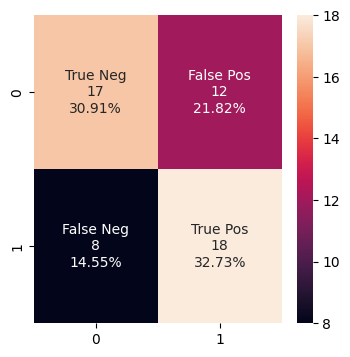

In [ ]:
group_names = ['True Neg','False Pos','False Neg','True Pos']
cf_matrix_cb = confusion_matrix(y_test,lgbm.predict(X_test))
group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix_cb.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix_cb.flatten()/np.sum(cf_matrix_cb)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
f, ax = plt.subplots(figsize=(4, 4))
sns.heatmap(cf_matrix_cb, annot=labels, fmt='')

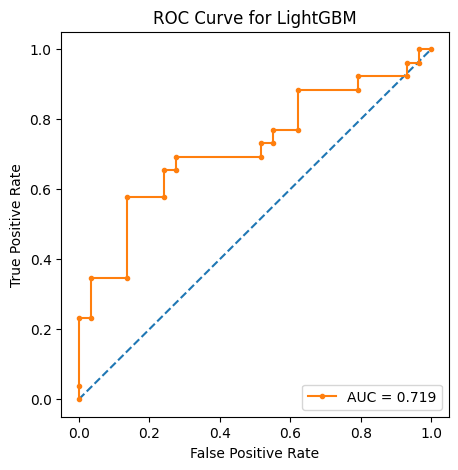

In [ ]:
false_pos_rate, true_pos_rate, proba = roc_curve(y_test, lgbm.predict_proba(X_test)[:,1])
f, ax = plt.subplots(figsize=(5, 5))
plt.plot([0,1], [0,1], linestyle="--") # plot random curve
plt.plot(false_pos_rate, true_pos_rate, marker=".", label=f"AUC = {roc_auc_score(y_test, lgbm.predict_proba(X_test)[:,1]):.3f}")
plt.title("ROC Curve for LightGBM")
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.legend(loc="lower right")

<Axes: >

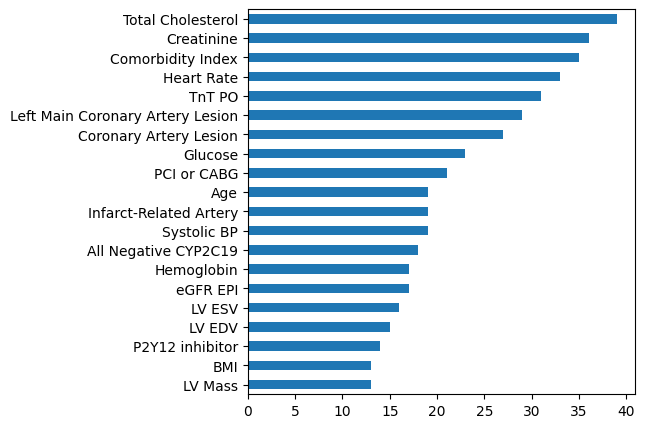

In [ ]:
fig, ax = plt.subplots(figsize=(5,5))
(pd.Series(lgbm.feature_importances_, index=X_train.columns)
   .nlargest(20)[::-1]
   .plot(kind='barh'))

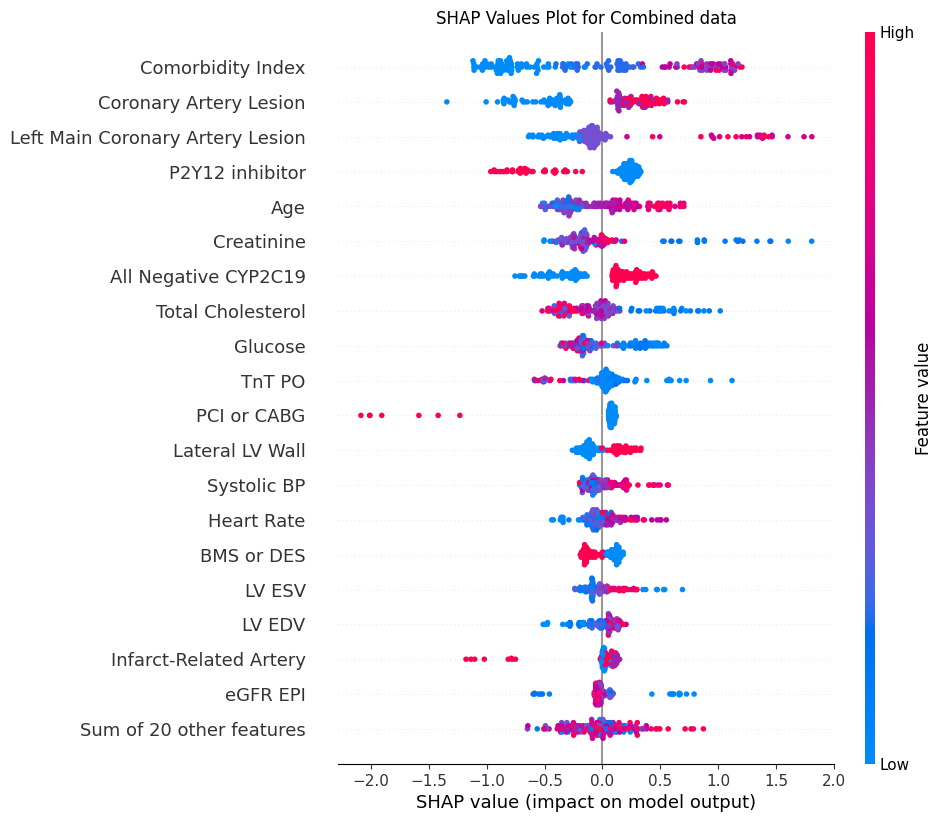

In [ ]:
explainer = shap.TreeExplainer(lgbm)
shap_values = explainer.shap_values(X_train)
plt.title("SHAP Values Plot for Combined data")
shap.plots.beeswarm(explainer(X_train), max_display=20)

# Another models

In [ ]:
X_train = imputed_train[sorted(imputed_train.columns)].copy()
X_test = imputed_test[sorted(imputed_train.columns)].copy()
X_train[cat_features] = X_train[cat_features].astype(int)
X_test[cat_features] = X_test[cat_features].astype(int)

## Random Forest

In [ ]:
def objective(trial):

    model = RandomForestClassifier(
        criterion= trial.suggest_categorical('criterion',['gini', 'entropy']),
        n_estimators=trial.suggest_int( "n_estimators",10, 500),
        max_depth=trial.suggest_int("max_depth", 2,11),
        min_samples_leaf=trial.suggest_int("min_samples_leaf", 2,100),
        random_state= trial.suggest_categorical('random_state',[random_state]),
        warm_start= trial.suggest_categorical('warm_start',[True,False]),
        class_weight = trial.suggest_categorical('class_weight',[None, 'balanced', 'balanced_subsample']),
        max_features=trial.suggest_float("max_features", 0.5, 1.0),
        max_samples=trial.suggest_float("max_samples", 0.5, 1.0)
    )

    kfolds = StratifiedKFold(n_splits=5, shuffle=True, random_state=random_state)

    scores = cross_val_score(
        model, X_train,y_train, cv=kfolds,
        scoring="roc_auc"
    )
    return scores.mean()

In [ ]:
sampler = optuna.samplers.TPESampler(seed = random_state)
study = optuna.create_study(study_name="ABCD_rf_hem_B", direction="maximize",sampler = sampler)
study.optimize(objective, n_trials=150)

[I 2024-06-25 12:35:15,174] A new study created in memory with name: ABCD_rf_hem_B
[I 2024-06-25 12:35:15,349] Trial 0 finished with value: 0.7452116402116402 and parameters: {'criterion': 'entropy', 'n_estimators': 10, 'max_depth': 5, 'min_samples_leaf': 16, 'random_state': 1, 'warm_start': False, 'class_weight': 'balanced_subsample', 'max_features': 0.7095972572016473, 'max_samples': 0.8426097501983798}. Best is trial 0 with value: 0.7452116402116402.
[I 2024-06-25 12:35:15,630] Trial 1 finished with value: 0.5 and parameters: {'criterion': 'entropy', 'n_estimators': 23, 'max_depth': 8, 'min_samples_leaf': 43, 'random_state': 1, 'warm_start': True, 'class_weight': 'balanced_subsample', 'max_features': 0.6567120890796214, 'max_samples': 0.846161307834657}. Best is trial 0 with value: 0.7452116402116402.
[I 2024-06-25 12:35:16,144] Trial 2 finished with value: 0.7614814814814814 and parameters: {'criterion': 'entropy', 'n_estimators': 51, 'max_depth': 2, 'min_samples_leaf': 18, 'random

In [ ]:
best_params = study.best_params
best_score = study.best_value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {best_params}\n")

Best score: 0.7980952380952381

Optimized parameters: {'criterion': 'gini', 'n_estimators': 118, 'max_depth': 4, 'min_samples_leaf': 4, 'random_state': 1, 'warm_start': False, 'class_weight': None, 'max_features': 0.8673444827246172, 'max_samples': 0.5009189583813758}



In [ ]:
rf = RandomForestClassifier(**best_params)
rf.fit(X_train,y_train)

RandomForestClassifier(max_depth=4, max_features=0.8673444827246172,
                       max_samples=0.5009189583813758, min_samples_leaf=4,
                       n_estimators=118, random_state=1)

In [ ]:
classifiers_predictions = {
    'RF' : rf.predict_proba(X_test)[:,1]
}
classifiers_results = pd.DataFrame(columns=['PR_AUC', 'ROC_AUC', 'F1-score', 'Precision', 'Recall', 'MCC', 'Accuracy'])

for method,pred in classifiers_predictions.items():
    pred_ = pred.round()
    classifiers_results.loc[method]= [round(average_precision_score(y_test,pred_),3),
                         round(roc_auc_score(y_test,pred),3),
                          round(f1_score(y_test,pred_),3),
                          round(precision_score(y_test,pred_),3),
                          round(recall_score(np.asarray(y_test.values),pred_),3),
                          round(matthews_corrcoef(np.asarray(y_test.values),pred_),3),
                          np.round(accuracy_score(y_test,pred_),decimals=4)]
classifiers_results.sort_values(by=['ROC_AUC','PR_AUC'],ascending=False)

,PR_AUC,ROC_AUC,F1-score,Precision,Recall,MCC,Accuracy
RF,0.494,0.662,0.606,0.5,0.769,0.089,0.527


In [ ]:
# Saving model
joblib.dump(rf, '/content/drive/MyDrive/1231_ABCD/rf_genetics_cyp.joblib')

['/content/drive/MyDrive/1231_ABCD/rf_genetics_cyp.joblib']

## Logreg

In [ ]:
# Define transformers
categorical_transformer = OneHotEncoder(handle_unknown='ignore')
float_transformer = StandardScaler()

# Apply transformers to respective features
preprocessor = ColumnTransformer(
    transformers=[
        #('cat', categorical_transformer, sorted(categorical+binary)),
        ('float', float_transformer, numerical)
    ])

# Transform data
X_processed = preprocessor.fit_transform(X_train)
X_processed_test = preprocessor.transform(X_test)

In [ ]:
def objective(trial):

    model = LogisticRegression(
        penalty = trial.suggest_categorical('penalty', ['l1', 'l2']),
        C = trial.suggest_float('C', 0.001, 10, log=True),
        random_state= trial.suggest_categorical('random_state',[random_state]),
        solver = trial.suggest_categorical('solver', ['liblinear'])
    )

    kfolds = StratifiedKFold(n_splits=5, shuffle=True, random_state=random_state)

    scores = cross_val_score(
        model, X_processed,y_train, cv=kfolds,
        scoring="roc_auc"
    )
    return scores.mean()

In [ ]:
sampler = optuna.samplers.TPESampler(seed = random_state)
study = optuna.create_study(study_name="ABCD_logreg_genetics", direction="maximize",sampler = sampler)
study.optimize(objective, n_trials=150)

[I 2024-06-25 12:41:06,274] A new study created in memory with name: ABCD_logreg_genetics
[I 2024-06-25 12:41:06,299] Trial 0 finished with value: 0.6402645502645502 and parameters: {'penalty': 'l2', 'C': 0.001001053986051049, 'random_state': 1, 'solver': 'liblinear'}. Best is trial 0 with value: 0.6402645502645502.
[I 2024-06-25 12:41:06,322] Trial 1 finished with value: 0.5 and parameters: {'penalty': 'l1', 'C': 0.0023407464805767528, 'random_state': 1, 'solver': 'liblinear'}. Best is trial 0 with value: 0.6402645502645502.
[I 2024-06-25 12:41:06,347] Trial 2 finished with value: 0.6507407407407407 and parameters: {'penalty': 'l2', 'C': 0.03864291653552653, 'random_state': 1, 'solver': 'liblinear'}. Best is trial 2 with value: 0.6507407407407407.
[I 2024-06-25 12:41:06,373] Trial 3 finished with value: 0.6748677248677248 and parameters: {'penalty': 'l1', 'C': 0.5506529897945993, 'random_state': 1, 'solver': 'liblinear'}. Best is trial 3 with value: 0.6748677248677248.
[I 2024-06-25 1

In [ ]:
best_params = study.best_params
best_score = study.best_value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {best_params}\n")

Best score: 0.6841798941798942

Optimized parameters: {'penalty': 'l1', 'C': 2.4784229060699046, 'random_state': 1, 'solver': 'liblinear'}



In [ ]:
logreg = LogisticRegression(**best_params)
logreg.fit(X_processed,y_train)

LogisticRegression(C=2.4784229060699046, penalty='l1', random_state=1,
                   solver='liblinear')

In [ ]:
# Saving model
joblib.dump(logreg, '/content/drive/MyDrive/1231_ABCD/logreg_genetics_cyp.joblib')

['/content/drive/MyDrive/1231_ABCD/logreg_genetics_cyp.joblib']

## SVM

In [ ]:
def objective(trial):

    model = SVC(
        C = trial.suggest_float('C', 0.001, 100,log=True),
        gamma = trial.suggest_float('gamma', 0.001, 10,log=True),
        random_state= trial.suggest_categorical('random_state',[random_state])
    )

    kfolds = StratifiedKFold(n_splits=5, shuffle=True, random_state=random_state)

    scores = cross_val_score(
        model, X_train,y_train, cv=kfolds,
        scoring="roc_auc",
        n_jobs=-1
    )
    return scores.mean()

In [ ]:
sampler = optuna.samplers.TPESampler(seed = random_state)
study = optuna.create_study(study_name="ABCD_genetics", direction="maximize",sampler = sampler)
study.optimize(objective, n_trials=150)

[I 2024-06-25 12:41:12,564] A new study created in memory with name: ABCD_genetics
[I 2024-06-25 12:41:15,888] Trial 0 finished with value: 0.5111111111111111 and parameters: {'C': 0.12164941464151847, 'gamma': 0.7608481233714796, 'random_state': 1}. Best is trial 0 with value: 0.5111111111111111.
[I 2024-06-25 12:41:16,027] Trial 1 finished with value: 0.5019841269841269 and parameters: {'C': 0.0010013176560941261, 'gamma': 0.016193110912440738, 'random_state': 1}. Best is trial 0 with value: 0.5111111111111111.
[I 2024-06-25 12:41:16,153] Trial 2 finished with value: 0.4927777777777777 and parameters: {'C': 0.005417257182767969, 'gamma': 0.0023407464805767528, 'random_state': 1}. Best is trial 0 with value: 0.5111111111111111.
[I 2024-06-25 12:41:16,282] Trial 3 finished with value: 0.5662962962962963 and parameters: {'C': 0.008536916958038761, 'gamma': 0.024112537061475744, 'random_state': 1}. Best is trial 3 with value: 0.5662962962962963.
[I 2024-06-25 12:41:16,406] Trial 4 finish

In [ ]:
best_params = study.best_params
best_score = study.best_value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {best_params}\n")

Best score: 0.5905555555555556

Optimized parameters: {'C': 7.7541828438031954, 'gamma': 0.037280802231872696, 'random_state': 1}



In [ ]:
svm = SVC(**best_params)
svm.fit(X_train,y_train)

SVC(C=7.7541828438031954, gamma=0.037280802231872696, random_state=1)

In [ ]:
# Saving model
joblib.dump(svm, '/content/drive/MyDrive/1231_ABCD/svm_genetics_cyp.joblib')

['/content/drive/MyDrive/1231_ABCD/svm_genetics_cyp.joblib']

## Results for alternative models

In [ ]:
rf = joblib.load('/content/drive/MyDrive/1231_ABCD/rf_genetics_cyp.joblib')
logreg = joblib.load('/content/drive/MyDrive/1231_ABCD/logreg_genetics_cyp.joblib')
svm = joblib.load('/content/drive/MyDrive/1231_ABCD/svm_genetics_cyp.joblib')
classifiers_predictions = {
    'RF' : rf.predict_proba(X_test)[:,1],
    'Logreg' : logreg.predict_proba(X_processed_test)[:,1],
    'SVM' : svm.predict(X_test)
}
classifiers_results = pd.DataFrame(columns=['PR_AUC', 'ROC_AUC', 'F1-score', 'Precision', 'Recall', 'MCC', 'Accuracy'])

for method,pred in classifiers_predictions.items():
    pred_ = pred.round()
    classifiers_results.loc[method]= [round(average_precision_score(y_test,pred_),3),
                         round(roc_auc_score(y_test,pred),3),
                          round(f1_score(y_test,pred_),3),
                          round(precision_score(y_test,pred_),3),
                          round(recall_score(np.asarray(y_test.values),pred_),3),
                          round(matthews_corrcoef(np.asarray(y_test.values),pred_),3),
                          np.round(accuracy_score(y_test,pred_),decimals=4)]
classifiers_results.sort_values(by=['ROC_AUC','PR_AUC'],ascending=False)

,PR_AUC,ROC_AUC,F1-score,Precision,Recall,MCC,Accuracy
RF,0.494,0.662,0.606,0.500,0.769,0.089,0.527
Logreg,0.526,0.629,0.646,0.538,0.808,0.206,0.582
SVM,0.473,0.500,0.642,0.473,1.000,0.000,0.473


<Axes: >

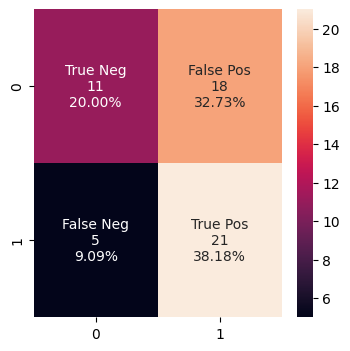

In [ ]:
group_names = ['True Neg','False Pos','False Neg','True Pos']
cf_matrix_cb = confusion_matrix(y_test,logreg.predict(X_processed_test))
group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix_cb.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix_cb.flatten()/np.sum(cf_matrix_cb)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
f, ax = plt.subplots(figsize=(4, 4))
sns.heatmap(cf_matrix_cb, annot=labels, fmt='')

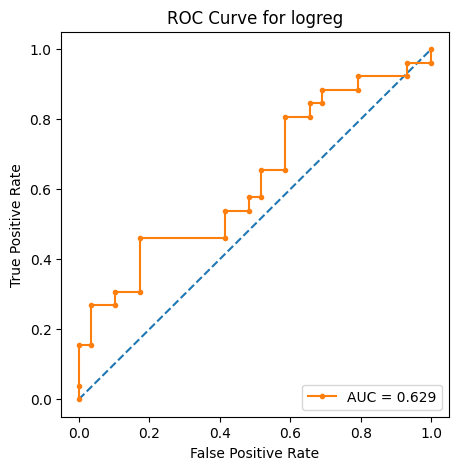

In [ ]:
false_pos_rate, true_pos_rate, proba = roc_curve(y_test, logreg.predict_proba(X_processed_test)[:,1])
f, ax = plt.subplots(figsize=(5, 5))
plt.plot([0,1], [0,1], linestyle="--") # plot random curve
plt.plot(false_pos_rate, true_pos_rate, marker=".", label=f"AUC = {roc_auc_score(y_test, logreg.predict_proba(X_processed_test)[:,1]):.3f}")
plt.title("ROC Curve for logreg")
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.legend(loc="lower right")

# Catboost

In [ ]:
X_train = imputed_train[sorted(imputed_train.columns)].copy()
X_test = imputed_test[sorted(imputed_train.columns)].copy()
X_train[cat_features] = X_train[cat_features].astype(int)
X_test[cat_features] = X_test[cat_features].astype(int)

## Main model

In [ ]:
def objective(trial):

# Define the parameters dictionary using suggestions from a hyperparameter optimization trial
  params = {
    "objective": trial.suggest_categorical("objective", ["Logloss"]),
    "iterations": trial.suggest_categorical("iterations", [500]),
    "learning_rate": trial.suggest_float("learning_rate", 1e-4, 5e-1, log=True),
    "depth": trial.suggest_int("depth", 2, 8),
    "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-1, 150.0, log=True),
    "random_strength": trial.suggest_float("random_strength", 1e-1, 10.0, log=True),
    "auto_class_weights": trial.suggest_categorical("auto_class_weights", [None, "Balanced", "SqrtBalanced"]),
    "verbose": False,
    "random_state": trial.suggest_categorical("random_state", [random_state]),
    "grow_policy": trial.suggest_categorical("grow_policy", ["SymmetricTree", "Depthwise", "Lossguide"]),
    "rsm": trial.suggest_float("rsm", 0.3, 1.0),
    "bootstrap_type": trial.suggest_categorical("bootstrap_type", ["Bayesian", "Bernoulli"])
    }

  if params["bootstrap_type"] == "Bayesian":
    params["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 10)
  elif params["bootstrap_type"] == "Bernoulli":
    params["subsample"] = trial.suggest_float("subsample", 0.1, 0.9)

  model = CatBoostClassifier(**params)

  kfolds = StratifiedKFold(n_splits=5, shuffle=True, random_state=random_state)

  scores = cross_val_score(
        model, X_train, y_train, cv=kfolds,
        scoring="roc_auc"
    )
  return scores.mean()

In [ ]:
sampler = optuna.samplers.TPESampler(seed = random_state)
study = optuna.create_study(study_name="catboost_genetics", direction="maximize",sampler = sampler)

study.optimize(objective, n_trials=150)

[I 2024-06-25 12:41:33,633] A new study created in memory with name: catboost_genetics
[I 2024-06-25 12:41:44,793] Trial 0 finished with value: 0.7618518518518519 and parameters: {'objective': 'Logloss', 'iterations': 500, 'learning_rate': 0.003487802515319415, 'depth': 7, 'l2_leaf_reg': 0.10008367981663674, 'random_strength': 0.402406646471461, 'auto_class_weights': 'SqrtBalanced', 'random_state': 1, 'grow_policy': 'Lossguide', 'rsm': 0.5934361600823064, 'bootstrap_type': 'Bayesian', 'bagging_temperature': 8.781174363909454}. Best is trial 0 with value: 0.7618518518518519.
[I 2024-06-25 12:41:53,188] Trial 1 finished with value: 0.7820105820105819 and parameters: {'objective': 'Logloss', 'iterations': 500, 'learning_rate': 0.00012627165880121756, 'depth': 6, 'l2_leaf_reg': 2.1154274483309874, 'random_strength': 1.3103269001464433, 'auto_class_weights': 'SqrtBalanced', 'random_state': 1, 'grow_policy': 'SymmetricTree', 'rsm': 0.9134724066072268, 'bootstrap_type': 'Bayesian', 'bagging_t

In [ ]:
best_params = study.best_params
best_score = study.best_value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {best_params}\n")

Best score: 0.8071957671957671

Optimized parameters: {'objective': 'Logloss', 'iterations': 500, 'learning_rate': 0.0003455442893294441, 'depth': 7, 'l2_leaf_reg': 7.04382083931474, 'random_strength': 4.7599164363022775, 'auto_class_weights': None, 'random_state': 1, 'grow_policy': 'Lossguide', 'rsm': 0.616931508412001, 'bootstrap_type': 'Bernoulli', 'subsample': 0.8361545618052207}



In [ ]:
catboost = CatBoostClassifier(**best_params)
catboost.fit(X_train,y_train)

0:	learn: 0.6930950	total: 4.55ms	remaining: 2.27s
1:	learn: 0.6929890	total: 9.22ms	remaining: 2.29s
2:	learn: 0.6929300	total: 13.3ms	remaining: 2.2s
3:	learn: 0.6928732	total: 17.4ms	remaining: 2.15s
4:	learn: 0.6928283	total: 21.7ms	remaining: 2.15s
5:	learn: 0.6927758	total: 25.3ms	remaining: 2.09s
6:	learn: 0.6927453	total: 30.8ms	remaining: 2.17s
7:	learn: 0.6926537	total: 35.7ms	remaining: 2.2s
8:	learn: 0.6926188	total: 41.2ms	remaining: 2.25s
9:	learn: 0.6925446	total: 46.9ms	remaining: 2.3s
10:	learn: 0.6924743	total: 52ms	remaining: 2.31s
11:	learn: 0.6924115	total: 57.7ms	remaining: 2.35s
12:	learn: 0.6923151	total: 62.9ms	remaining: 2.36s
13:	learn: 0.6922745	total: 68.4ms	remaining: 2.38s
14:	learn: 0.6921924	total: 73.3ms	remaining: 2.37s
15:	learn: 0.6921623	total: 78.5ms	remaining: 2.37s
16:	learn: 0.6921168	total: 83.7ms	remaining: 2.38s
17:	learn: 0.6920700	total: 87.6ms	remaining: 2.35s
18:	learn: 0.6920149	total: 91.6ms	remaining: 2.32s
19:	learn: 0.6919590	total:

In [ ]:
classifiers_predictions = {
    'Catboost' : catboost.predict_proba(X_test)[:,1]
}
classifiers_results = pd.DataFrame(columns=['PR_AUC', 'ROC_AUC', 'F1-score', 'Precision', 'Recall', 'MCC', 'Accuracy'])

for method,pred in classifiers_predictions.items():
    pred_ = pred.round()
    classifiers_results.loc[method]= [round(average_precision_score(y_test,pred_),3),
                         round(roc_auc_score(y_test,pred),3),
                          round(f1_score(y_test,pred_),3),
                          round(precision_score(y_test,pred_),3),
                          round(recall_score(np.asarray(y_test.values),pred_),3),
                          round(matthews_corrcoef(np.asarray(y_test.values),pred_),3),
                          np.round(accuracy_score(y_test,pred_),decimals=4)]
classifiers_results.sort_values(by=['ROC_AUC','PR_AUC'],ascending=False)

,PR_AUC,ROC_AUC,F1-score,Precision,Recall,MCC,Accuracy
Catboost,0.53,0.682,0.685,0.532,0.962,0.287,0.582


In [ ]:
# Saving model
joblib.dump(catboost, '/content/drive/MyDrive/1231_ABCD/catboost_genetics_cyp.joblib')

['/content/drive/MyDrive/1231_ABCD/catboost_genetics_cyp.joblib']

## Catboost Feature selection

In [ ]:
# Определение параметров модели CatBoost
catboost = joblib.load('/content/drive/MyDrive/1231_ABCD/catboost_genetics_cyp.joblib')
params = catboost.get_params()

# Создание пула данных
train_pool = cb.Pool(X_train, y_train)

In [ ]:
# Первоначальное качество модели
initial_auc = roc_auc_score(y_test, catboost.predict_proba(X_test)[:, 1])
print(f'Initial ROC-AUC: {initial_auc:.4f}')

Initial ROC-AUC: 0.6817


In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

selected_features = catboost.select_features(
    X_train,
    y_train,
    features_for_select='0-38',
    num_features_to_select=1,  # Количество признаков для отбора
    steps=len(X_train.columns)-1,
    algorithm='RecursiveByShapValues',  # Метод отбора признаков
    shap_calc_type='Regular',
    train_final_model=False,
    logging_level='Silent',
    plot=True
)

print(f'Selected features: {selected_features["selected_features_names"]}')
joblib.dump(selected_features, '/content/drive/MyDrive/1231_ABCD/catboost_selected_features_genetics_cyp.joblib')

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Selected features: ['BMS or DES']


['/content/drive/MyDrive/1231_ABCD/catboost_selected_features_genetics_cyp.joblib']

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

selected_features = catboost.select_features(
    X_train,
    y_train,
    features_for_select='0-38',
    num_features_to_select=7,  # Количество признаков для отбора
    steps=len(X_train.columns)-7,
    algorithm='RecursiveByShapValues',  # Метод отбора признаков
    shap_calc_type='Regular',
    train_final_model=False,
    logging_level='Silent',
    plot=True
)

print(f'Selected features: {selected_features["selected_features_names"]}')

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Selected features: ['Age', 'All Negative CYP2C19', 'BMS or DES', 'Comorbidity Index', 'Coronary Artery Lesion', 'Left Main Coronary Artery Lesion', 'P2Y12 inhibitor']


## Catboost model on subset

In [ ]:
subset = ['Age', 'All Negative CYP2C19', 'BMS or DES', 'Comorbidity Index', 'Coronary Artery Lesion', 'Left Main Coronary Artery Lesion', 'P2Y12 inhibitor']

In [ ]:
X_train = imputed_train[sorted(imputed_train.columns)].copy()
X_test = imputed_test[sorted(imputed_train.columns)].copy()
X_train[cat_features] = X_train[cat_features].astype(int)
X_test[cat_features] = X_test[cat_features].astype(int)
X_train = X_train[sorted(subset)]
X_test = X_test[sorted(subset)]

In [ ]:
def objective(trial):

# Define the parameters dictionary using suggestions from a hyperparameter optimization trial
  params = {
    "objective": trial.suggest_categorical("objective", ["Logloss"]),
    "iterations": trial.suggest_categorical("iterations", [500]),
    "learning_rate": trial.suggest_float("learning_rate", 1e-4, 5e-1, log=True),
    "depth": trial.suggest_int("depth", 2, 8),
    "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-1, 150.0, log=True),
    "random_strength": trial.suggest_float("random_strength", 1e-1, 10.0, log=True),
    "auto_class_weights": trial.suggest_categorical("auto_class_weights", [None, "Balanced", "SqrtBalanced"]),
    "verbose": False,
    "random_state": trial.suggest_categorical("random_state", [random_state]),
    "grow_policy": trial.suggest_categorical("grow_policy", ["SymmetricTree", "Depthwise", "Lossguide"]),
    "rsm": trial.suggest_float("rsm", 0.3, 1.0),
    "bootstrap_type": trial.suggest_categorical("bootstrap_type", ["Bayesian", "Bernoulli"])
    }

  if params["bootstrap_type"] == "Bayesian":
    params["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 10)
  elif params["bootstrap_type"] == "Bernoulli":
    params["subsample"] = trial.suggest_float("subsample", 0.1, 0.9)

  model = CatBoostClassifier(**params)

  kfolds = StratifiedKFold(n_splits=5, shuffle=True, random_state=random_state)

  scores = cross_val_score(
        model, X_train, y_train, cv=kfolds,
        scoring="roc_auc"
    )
  return scores.mean()

In [ ]:
sampler = optuna.samplers.TPESampler(seed = random_state)
study = optuna.create_study(study_name="catboost_genetics", direction="maximize",sampler = sampler)

study.optimize(objective, n_trials=150)

[I 2024-06-25 13:17:06,713] A new study created in memory with name: catboost_genetics
[I 2024-06-25 13:17:09,713] Trial 0 finished with value: 0.8133333333333332 and parameters: {'objective': 'Logloss', 'iterations': 500, 'learning_rate': 0.003487802515319415, 'depth': 7, 'l2_leaf_reg': 0.10008367981663674, 'random_strength': 0.402406646471461, 'auto_class_weights': 'SqrtBalanced', 'random_state': 1, 'grow_policy': 'Lossguide', 'rsm': 0.5934361600823064, 'bootstrap_type': 'Bayesian', 'bagging_temperature': 8.781174363909454}. Best is trial 0 with value: 0.8133333333333332.
[I 2024-06-25 13:17:11,394] Trial 1 finished with value: 0.8248677248677249 and parameters: {'objective': 'Logloss', 'iterations': 500, 'learning_rate': 0.00012627165880121756, 'depth': 6, 'l2_leaf_reg': 2.1154274483309874, 'random_strength': 1.3103269001464433, 'auto_class_weights': 'SqrtBalanced', 'random_state': 1, 'grow_policy': 'SymmetricTree', 'rsm': 0.9134724066072268, 'bootstrap_type': 'Bayesian', 'bagging_t

In [ ]:
best_params = study.best_params
best_score = study.best_value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {best_params}\n")

Best score: 0.8417989417989418

Optimized parameters: {'objective': 'Logloss', 'iterations': 500, 'learning_rate': 0.00016204941159267175, 'depth': 7, 'l2_leaf_reg': 6.432633856655513, 'random_strength': 4.003103658246933, 'auto_class_weights': 'SqrtBalanced', 'random_state': 1, 'grow_policy': 'Lossguide', 'rsm': 0.9373040352835207, 'bootstrap_type': 'Bernoulli', 'subsample': 0.4483621460611521}



In [ ]:
catboost = CatBoostClassifier(**best_params)
catboost.fit(X_train,y_train)

0:	learn: 0.6931094	total: 1.3ms	remaining: 649ms
1:	learn: 0.6930713	total: 3.07ms	remaining: 766ms
2:	learn: 0.6930351	total: 4.39ms	remaining: 727ms
3:	learn: 0.6929897	total: 5.79ms	remaining: 718ms
4:	learn: 0.6929449	total: 7.07ms	remaining: 700ms
5:	learn: 0.6929014	total: 8.37ms	remaining: 689ms
6:	learn: 0.6928549	total: 9.47ms	remaining: 667ms
7:	learn: 0.6928109	total: 10.5ms	remaining: 647ms
8:	learn: 0.6927429	total: 11.6ms	remaining: 633ms
9:	learn: 0.6927016	total: 12.6ms	remaining: 617ms
10:	learn: 0.6926550	total: 13.3ms	remaining: 592ms
11:	learn: 0.6926093	total: 14.5ms	remaining: 590ms
12:	learn: 0.6925771	total: 15.7ms	remaining: 587ms
13:	learn: 0.6925226	total: 16.8ms	remaining: 584ms
14:	learn: 0.6924699	total: 17.9ms	remaining: 579ms
15:	learn: 0.6923797	total: 19.1ms	remaining: 578ms
16:	learn: 0.6923332	total: 20.6ms	remaining: 586ms
17:	learn: 0.6922791	total: 21.8ms	remaining: 583ms
18:	learn: 0.6922350	total: 22.8ms	remaining: 578ms
19:	learn: 0.6921960	to

In [ ]:
classifiers_predictions = {
    'Catboost' : catboost.predict_proba(X_test)[:,1]
}
classifiers_results = pd.DataFrame(columns=['PR_AUC', 'ROC_AUC', 'F1-score', 'Precision', 'Recall', 'MCC', 'Accuracy'])

for method,pred in classifiers_predictions.items():
    pred_ = pred.round()
    classifiers_results.loc[method]= [round(average_precision_score(y_test,pred_),3),
                         round(roc_auc_score(y_test,pred),3),
                          round(f1_score(y_test,pred_),3),
                          round(precision_score(y_test,pred_),3),
                          round(recall_score(np.asarray(y_test.values),pred_),3),
                          round(matthews_corrcoef(np.asarray(y_test.values),pred_),3),
                          np.round(accuracy_score(y_test,pred_),decimals=4)]
classifiers_results.sort_values(by=['ROC_AUC','PR_AUC'],ascending=False)

,PR_AUC,ROC_AUC,F1-score,Precision,Recall,MCC,Accuracy
Catboost,0.561,0.721,0.655,0.594,0.731,0.286,0.636


In [ ]:
# Saving model
joblib.dump(catboost, '/content/drive/MyDrive/1231_ABCD/catboost_subset_genetics_cyp.joblib')

['/content/drive/MyDrive/1231_ABCD/catboost_subset_genetics_cyp.joblib']

## Catboost model with uncertainty

In [ ]:
subset = ['Age', 'All Negative CYP2C19', 'BMS or DES', 'Comorbidity Index',
          'Coronary Artery Lesion', 'Left Main Coronary Artery Lesion', 'P2Y12 inhibitor']

In [ ]:
X_train = imputed_train[sorted(imputed_train.columns)].copy()
X_test = imputed_test[sorted(imputed_train.columns)].copy()
X_train[cat_features] = X_train[cat_features].astype(int)
X_test[cat_features] = X_test[cat_features].astype(int)
X_train = X_train[sorted(subset)]
X_test = X_test[sorted(subset)]

In [ ]:
# Определение параметров модели CatBoost
catboost = joblib.load('/content/drive/MyDrive/1231_ABCD/catboost_subset_genetics_cyp.joblib')
params = catboost.get_params()

In [ ]:
# Получение предсказаний и оценка неопределенности
preds_proba = catboost.predict_proba(X_test)[:, 1]

uncertainties = catboost.virtual_ensembles_predict(X_test,
    prediction_type='VirtEnsembles',
    ntree_end=0,
    virtual_ensembles_count=10,
    thread_count=-1,
    verbose=None)

In [ ]:
uncertainty_threshold = 0.1  # Порог неопределенности
high_uncertainty_samples = X_test[uncertainties > uncertainty_threshold]

print(f'Количество объектов с высокой неопределенностью: {len(high_uncertainty_samples)}')

Количество объектов с высокой неопределенностью: 13


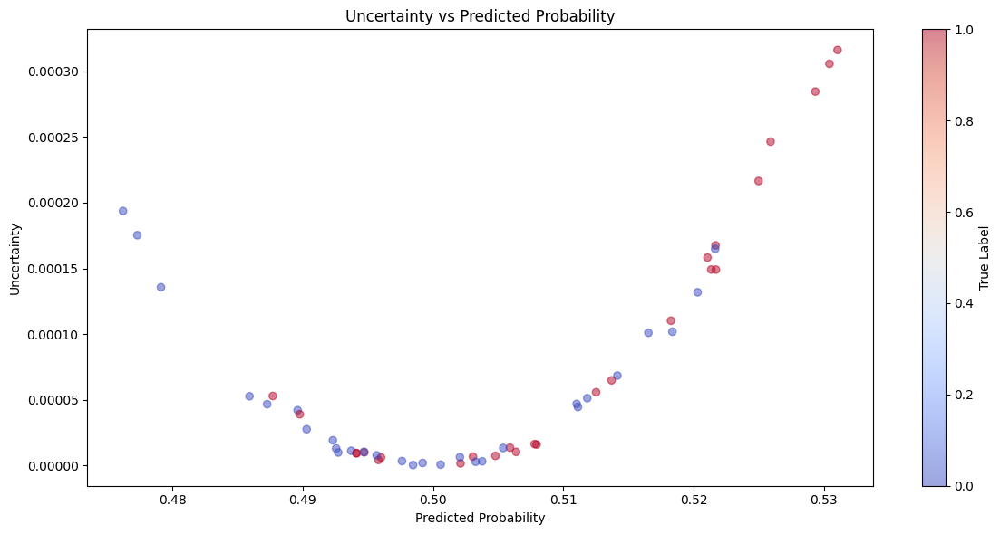

In [ ]:
# Визуализация неопределенности
def plot_uncertainty(predictions, uncertainties, y_true):
    plt.figure(figsize=(12, 6))

    # График рассеяния предсказаний против неопределенности
    # plt.subplot(1, 2, 1)
    plt.scatter(predictions, uncertainties.var(axis=1).T[0], alpha=0.5, c=y_true, cmap='coolwarm')
    plt.colorbar(label='True Label')
    plt.xlabel('Predicted Probability')
    plt.ylabel('Uncertainty')
    plt.title('Uncertainty vs Predicted Probability')

    # Гистограмма распределения неопределенности
    # plt.subplot(1, 2, 2)
    # sns.distplot(uncertainties.var(axis=1).T[0],color='g')
    # plt.xlabel('Uncertainty')
    # plt.ylabel('Frequency')
    # plt.title('Distribution of Uncertainty')

    plt.tight_layout()
    plt.show()

# Визуализация результатов
plot_uncertainty(preds_proba, uncertainties, y_test)

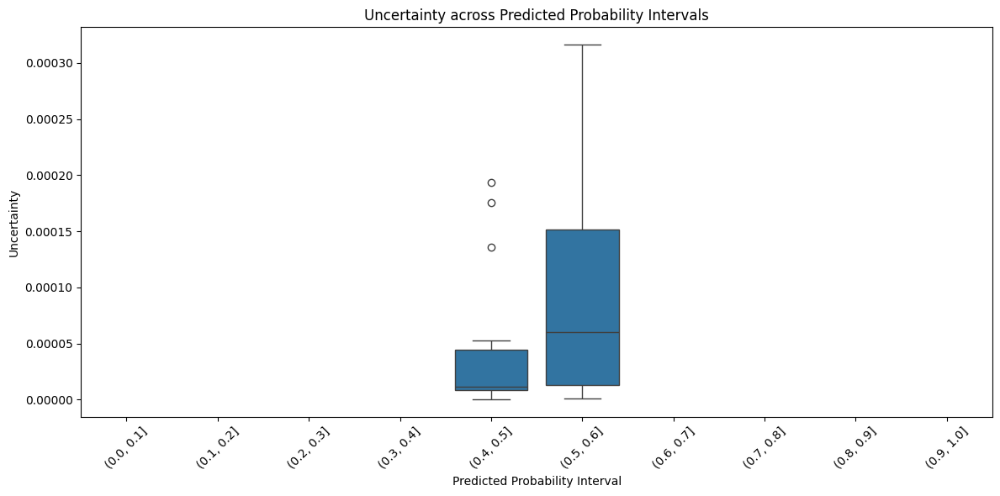

In [ ]:
def plot_boxplot_uncertainty(predictions, uncertainties):
    # Создание интервалов предсказанных вероятностей
    prediction_intervals = pd.cut(predictions, bins=np.arange(0, 1.1, 0.1))

    # Создание DataFrame для удобства визуализации
    df = pd.DataFrame({'Prediction Interval': prediction_intervals, 'Uncertainty': uncertainties.var(axis=1).T[0]})

    plt.figure(figsize=(12, 6))
    sns.boxplot(x='Prediction Interval', y='Uncertainty', data=df)
    plt.xlabel('Predicted Probability Interval')
    plt.ylabel('Uncertainty')
    plt.title('Uncertainty across Predicted Probability Intervals')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Визуализация результатов
plot_boxplot_uncertainty(preds_proba, uncertainties)

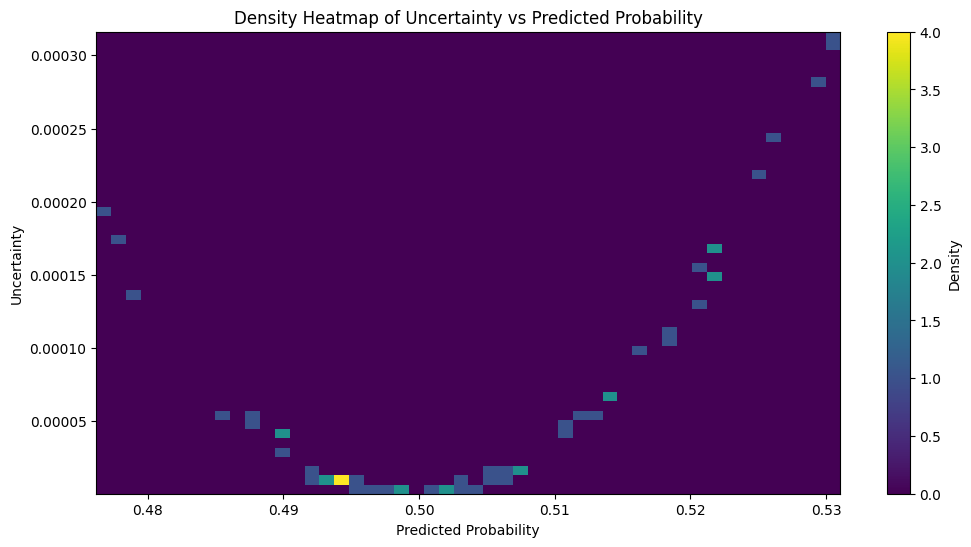

In [ ]:
def plot_heatmap_uncertainty(predictions, uncertainties):
    plt.figure(figsize=(12, 6))

    # Создание двумерной гистограммы
    heatmap, xedges, yedges = np.histogram2d(predictions, uncertainties.var(axis=1).T[0], bins=(50, 50))

    # Построение тепловой карты
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    plt.imshow(heatmap.T, extent=extent, origin='lower', cmap='viridis', aspect='auto')
    plt.colorbar(label='Density')
    plt.xlabel('Predicted Probability')
    plt.ylabel('Uncertainty')
    plt.title('Density Heatmap of Uncertainty vs Predicted Probability')
    plt.show()

# Визуализация результатов
plot_heatmap_uncertainty(preds_proba, uncertainties)

# LGBM + Feature Selection

## SFS

In [ ]:
lgbm = joblib.load('/content/drive/MyDrive/1231_ABCD/lgbm_genetics_cyp.joblib')

In [ ]:
params = lgbm.get_params()
params['verbosity'] = -1

In [ ]:
lgbm = lgb.LGBMClassifier(**params)
lgbm.fit(X_train,y_train)

LGBMClassifier(colsample_bytree=0.7969942361496657,
               learning_rate=0.08038838986651412, max_depth=3,
               min_child_samples=5, num_leaves=9,
               reg_alpha=1.302644442327214e-08,
               reg_lambda=0.0016946028725775292, verbosity=-1)

In [ ]:
sfsl = SFS(estimator = lgbm, forward = False, floating=True, scoring = 'roc_auc', cv=5, verbose=1,n_jobs=2)
sfsl.fit(X_train,y_train)

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  39 out of  39 | elapsed:    8.1s finished
Features: 38/1[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  38 out of  38 | elapsed:    6.0s finished
Features: 37/1[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 out of  37 | elapsed:    3.7s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   2 out of   2 | elapsed:    0.2s finished
Features: 36/1[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  36 out of  36 | elapsed:    3.4s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   3 out of   3 | elapsed:    0.3s finished
Features: 35/1[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.

SequentialFeatureSelector(estimator=LGBMClassifier(colsample_bytree=0.7969942361496657,
                                                   learning_rate=0.08038838986651412,
                                                   max_depth=3,
                                                   min_child_samples=5,
                                                   num_leaves=9,
                                                   reg_alpha=1.302644442327214e-08,
                                                   reg_lambda=0.0016946028725775292,
                                                   verbosity=-1),
                          floating=True, forward=False, k_features=(1, 1),
                          n_jobs=2, scoring='roc_auc', verbose=1)

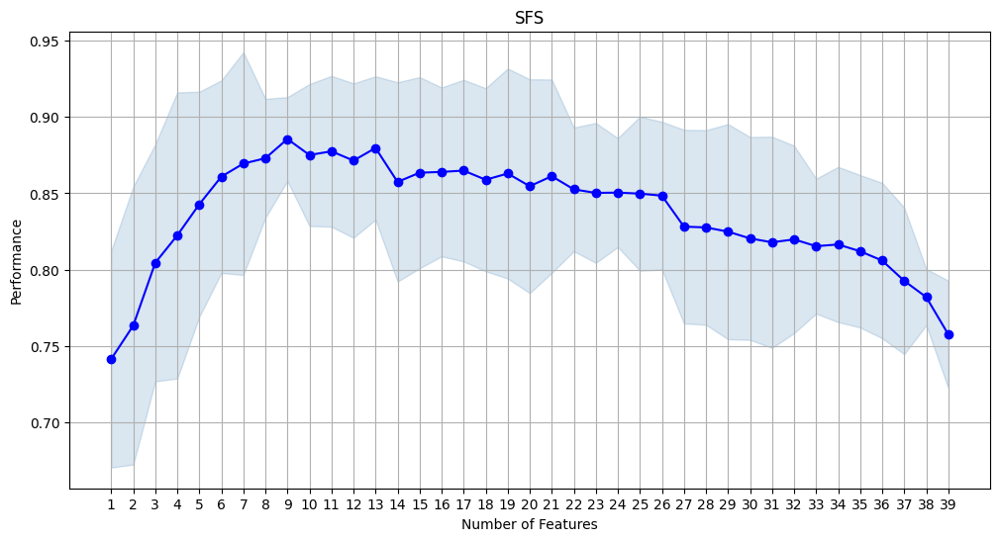

In [ ]:
fig1 = plot_sfs(sfsl.get_metric_dict(),kind = 'std_dev',figsize=(12,6))
plt.title('SFS')
plt.grid()
plt.show()

In [ ]:
joblib.dump(sfsl.get_metric_dict(), '/content/drive/MyDrive/1231_ABCD/metric_dict_genetics_cyp.zip')

['/content/drive/MyDrive/1231_ABCD/metric_dict_genetics_cyp.zip']

In [ ]:
scores = [element['avg_score'] for element in sfsl.get_metric_dict().values()]
best_combination_index = np.argmax(scores) + 1
best_combination = sfsl.get_metric_dict()[40 - best_combination_index]['feature_names']
print('Best number of features: ', len(best_combination))
print(sfsl.get_metric_dict()[40 - best_combination_index])
print('Features: ', best_combination)

Best number of features:  9
{'feature_idx': (0, 1, 7, 8, 12, 25, 27, 28, 29), 'cv_scores': array([0.85185185, 0.87037037, 0.87222222, 0.92857143, 0.9047619 ]), 'avg_score': 0.8855555555555557, 'feature_names': ('Age', 'All Negative CYP2C19', 'Comorbidity Index', 'Coronary Artery Lesion', 'Gender', 'Lateral LV Wall', 'Left Main Coronary Artery Lesion', 'P2Y12 inhibitor', 'PCI or CABG'), 'ci_bound': 0.03526270744219433, 'std_dev': 0.0274355843800971, 'std_err': 0.013717792190048548}
Features:  ('Age', 'All Negative CYP2C19', 'Comorbidity Index', 'Coronary Artery Lesion', 'Gender', 'Lateral LV Wall', 'Left Main Coronary Artery Lesion', 'P2Y12 inhibitor', 'PCI or CABG')


## Model on subset

In [ ]:
metric_dict = joblib.load( '/content/drive/MyDrive/1231_ABCD/metric_dict_genetics_cyp.zip')
scores = [element['avg_score'] for element in metric_dict.values()]
best_combination_index = np.argmax(scores) + 1
best_combination = metric_dict[40 - best_combination_index]['feature_names']
s = sorted(best_combination)

In [ ]:
X_train = imputed_train[s].copy()
X_test = imputed_test[s].copy()
new_cat_features = sorted([column for column in X_train.columns if column in cat_features])
X_train[new_cat_features] = X_train[new_cat_features].astype(int)
X_test[new_cat_features] = X_test[new_cat_features].astype(int)
# y_train,y_test = train['combined'], test['combined']

In [ ]:
def objective(trial):

    params = {
        'objective': 'binary',
        'metric': 'auc',
        'verbosity': -1,
        'boosting_type': 'gbdt',
        'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-8, 10.0),
        'reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-8, 10.0),
        'num_leaves': trial.suggest_int('num_leaves', 2, 10),
        'max_depth': trial.suggest_int('max_depth', 2, 8),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 0.1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1.0),
        'n_estimators': 1000,  # Фиксированное количество деревьев
        'random_state': random_state,
        'early_stopping_round': 100  # Ранний останов для предотвращения переобучения
      }

    cv_results = lgb.cv(
          params,
          lgb.Dataset(X_train, label=y_train),
          num_boost_round=1000,
          nfold=5,
          stratified=True,
          #verbose_eval=False,
          metrics='auc',
          seed = random_state
      )

    auc_mean = cv_results['valid auc-mean'][-1]

    return auc_mean

In [ ]:
sampler = optuna.samplers.TPESampler(seed = random_state)
study = optuna.create_study(study_name="selected_genetics", direction="maximize",sampler = sampler)
study.optimize(objective, n_trials=150)

[I 2024-06-26 12:31:30,007] A new study created in memory with name: selected_genetics
[I 2024-06-26 12:31:30,523] Trial 0 finished with value: 0.7615079365079365 and parameters: {'reg_alpha': 5.6649755830282306e-05, 'reg_lambda': 0.030403280126677572, 'num_leaves': 2, 'max_depth': 4, 'min_child_samples': 19, 'learning_rate': 0.00018924123965722266, 'colsample_bytree': 0.4303821479643696}. Best is trial 0 with value: 0.7615079365079365.
[I 2024-06-26 12:31:30,636] Trial 1 finished with value: 0.5 and parameters: {'reg_alpha': 1.2883876209377052e-05, 'reg_lambda': 3.72312200494449e-05, 'num_leaves': 6, 'max_depth': 4, 'min_child_samples': 70, 'learning_rate': 0.00041054120168588934, 'colsample_bytree': 0.9146822054736616}. Best is trial 0 with value: 0.7615079365079365.
[I 2024-06-26 12:31:31,091] Trial 2 finished with value: 0.7965873015873015 and parameters: {'reg_alpha': 1.763958399884789e-08, 'reg_lambda': 0.010819509974097813, 'num_leaves': 5, 'max_depth': 5, 'min_child_samples': 1

In [ ]:
best_params = study.best_params
best_score = study.best_value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {best_params}\n")

Best score: 0.8802116402116402

Optimized parameters: {'reg_alpha': 3.5038176429550124e-06, 'reg_lambda': 0.012759262261062942, 'num_leaves': 6, 'max_depth': 3, 'min_child_samples': 5, 'learning_rate': 0.044807472127139404, 'colsample_bytree': 0.34670222348016505}



In [ ]:
lgbm_selected = lgb.LGBMClassifier(**best_params)
lgbm_selected.fit(X_train,y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 90, number of negative: 73
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 163, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.552147 -> initscore=0.209350
[LightGBM] [Info] Start training from score 0.209350
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LGBMClassifier(colsample_bytree=0.34670222348016505,
               learning_rate=0.044807472127139404, max_depth=3,
               min_child_samples=5, num_leaves=6,
               reg_alpha=3.5038176429550124e-06,
               reg_lambda=0.012759262261062942)

In [ ]:
classifiers_predictions = {
    'lgbm_selected' : lgbm_selected.predict_proba(X_test)[:,1]
}
classifiers_results = pd.DataFrame(columns=['PR_AUC', 'ROC_AUC', 'F1-score', 'Precision', 'Recall', 'MCC', 'Accuracy'])

for method,pred in classifiers_predictions.items():
    pred_ = pred.round()
    classifiers_results.loc[method]= [round(average_precision_score(y_test,pred_),3),
                         round(roc_auc_score(y_test,pred),3),
                          round(f1_score(y_test,pred_),3),
                          round(precision_score(y_test,pred_),3),
                          round(recall_score(np.asarray(y_test.values),pred_),3),
                          round(matthews_corrcoef(np.asarray(y_test.values),pred_),3),
                          np.round(accuracy_score(y_test,pred_),decimals=4)]
classifiers_results.sort_values(by=['ROC_AUC','PR_AUC'],ascending=False)

,PR_AUC,ROC_AUC,F1-score,Precision,Recall,MCC,Accuracy
lgbm_selected,0.548,0.698,0.644,0.576,0.731,0.253,0.618


In [ ]:
# Saving model
joblib.dump(lgbm_selected, '/content/drive/MyDrive/1231_ABCD/lgbm_selected_genetics_cyp.joblib')

['/content/drive/MyDrive/1231_ABCD/lgbm_selected_genetics_cyp.joblib']

# Model on 2 features

In [ ]:
X_train = imputed_train[sorted(imputed_train.columns)].copy()
X_test = imputed_test[sorted(imputed_train.columns)].copy()
X_train[cat_features] = X_train[cat_features].astype(int)
X_test[cat_features] = X_test[cat_features].astype(int)
s = sorted(['All Negative CYP2C19','P2Y12 inhibitor'])

In [ ]:
catboost = DecisionTreeClassifier()#lgb.LGBMClassifier()
catboost.fit(X_train[s],y_train)

DecisionTreeClassifier()

In [ ]:
classifiers_predictions = {
    'lgb.LGBMClassifier' : catboost.predict_proba(X_train[s])[:,1]
}
classifiers_results = pd.DataFrame(columns=['PR_AUC', 'ROC_AUC', 'F1-score', 'Precision', 'Recall', 'MCC', 'Accuracy'])

for method,pred in classifiers_predictions.items():
    pred_ = pred.round()
    classifiers_results.loc[method]= [round(average_precision_score(y_train,pred_),3),
                         round(roc_auc_score(y_train,pred),3),
                          round(f1_score(y_train,pred_),3),
                          round(precision_score(y_train,pred_),3),
                          round(recall_score(np.asarray(y_train.values),pred_),3),
                          round(matthews_corrcoef(np.asarray(y_train.values),pred_),3),
                          np.round(accuracy_score(y_train,pred_),decimals=4)]
classifiers_results.sort_values(by=['ROC_AUC','PR_AUC'],ascending=False)

,PR_AUC,ROC_AUC,F1-score,Precision,Recall,MCC,Accuracy
lgb.LGBMClassifier,0.699,0.744,0.711,0.776,0.656,0.421,0.706


In [ ]:
# Saving model
joblib.dump(catboost, '/content/drive/MyDrive/1231_ABCD/catboost_strat_genetics_cyp_2f.joblib')

['/content/drive/MyDrive/1231_ABCD/catboost_strat_genetics_cyp_2f.joblib']

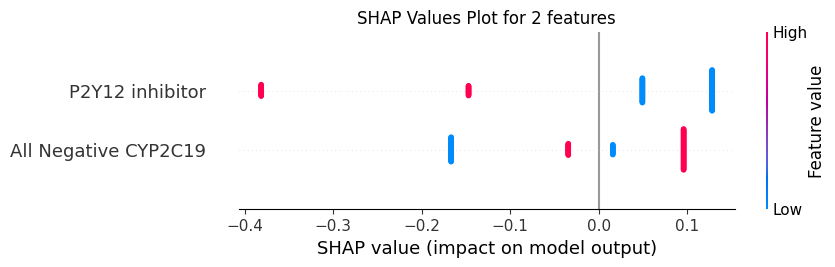

In [ ]:
explainer = shap.TreeExplainer(catboost)
shap_values = explainer.shap_values(X_train[s])
plt.title("SHAP Values Plot for 2 features")
shap.plots.beeswarm(explainer(X_train[s])[:,:,1], max_display=20)

# Final results evaluation with bootstrap

In [ ]:
cat_features = categorical

In [ ]:
from sklearn.metrics import auc,precision_recall_curve

In [ ]:
def evaluate_metrics(classifiers, X_test, y_test, num_bootstrap=1000, random_state=random_state):
    metrics = ['PR_AUC', 'ROC_AUC', 'F1-score', 'Precision', 'Recall', 'MCC', 'Accuracy']
    results = {}

    for clf_name, clf in classifiers.items():
        metric_scores = []
        for i in range(num_bootstrap):
            # Initialize random number generator
            rng = np.random.default_rng(random_state + i)

            # Bootstrap resampling
            num_samples = len(X_test)
            bootstrap_indices = rng.choice(num_samples, num_samples, replace=True)
            X_bootstrap = X_test.iloc[bootstrap_indices]
            y_bootstrap = y_test.iloc[bootstrap_indices]

            # Handle the case when only one class is present in y_bootstrap
            if len(np.unique(y_bootstrap)) == 1:
                continue

            if clf_name!='SVM':
              # Predict probabilities
              y_prob = clf.predict_proba(X_bootstrap)[:, 1]

            else:
              y_prob = clf.predict(X_bootstrap)

            # Calculate metrics
            y_prob_round = y_prob.round()
            pr,rec,tres = precision_recall_curve(y_bootstrap, y_prob)
            pr_auc = auc(rec,pr)
            roc_auc = roc_auc_score(y_bootstrap, y_prob)
            f1 = f1_score(y_bootstrap, y_prob_round)
            precision = precision_score(y_bootstrap, y_prob_round)
            recall = recall_score(y_bootstrap, y_prob_round)
            mcc = matthews_corrcoef(y_bootstrap, y_prob_round)
            accuracy = accuracy_score(y_bootstrap, y_prob_round)

            metric_scores.append((pr_auc, roc_auc, f1, precision, recall, mcc, accuracy))

        metric_scores = np.array(metric_scores)
        mean_scores = np.mean(metric_scores, axis=0)
        results[clf_name] = mean_scores

    results_df = pd.DataFrame.from_dict(results, orient='index', columns=metrics)
    return results_df

In [ ]:
X_train = imputed_train[sorted(imputed_train.columns)].copy()
X_test = imputed_test[sorted(imputed_train.columns)].copy()
X_train[cat_features] = X_train[cat_features].astype(int)
X_test[cat_features] = X_test[cat_features].astype(int)

In [ ]:
baseline = joblib.load('/content/drive/MyDrive/1231_ABCD/baseline_genetics_cyp.pkl')
catboost = joblib.load('/content/drive/MyDrive/1231_ABCD/catboost_genetics_cyp.joblib')
catboost_selected = joblib.load('/content/drive/MyDrive/1231_ABCD/lgbm_selected_genetics_cyp.joblib')
rf = joblib.load('/content/drive/MyDrive/1231_ABCD/rf_genetics_cyp.joblib')
logreg = joblib.load('/content/drive/MyDrive/1231_ABCD/logreg_genetics_cyp.joblib')
svm = joblib.load('/content/drive/MyDrive/1231_ABCD/svm_genetics_cyp.joblib')
lgbm_model = joblib.load('/content/drive/MyDrive/1231_ABCD/lgbm_genetics_cyp.joblib')
catboost_2_features = joblib.load('/content/drive/MyDrive/1231_ABCD/catboost_strat_genetics_cyp_2f.joblib')
catboost_sfs = joblib.load('/content/drive/MyDrive/1231_ABCD/catboost_subset_genetics_cyp.joblib')

metric_dict = joblib.load( '/content/drive/MyDrive/1231_ABCD/metric_dict_genetics_cyp.zip')
scores = [element['avg_score'] for element in metric_dict.values()]
best_combination_index = np.argmax(scores) + 1
best_combination = metric_dict[40 - best_combination_index]['feature_names']
s = list(best_combination)
s2 = sorted(['All Negative CYP2C19','P2Y12 inhibitor'])
s3 = ['Age', 'All Negative CYP2C19', 'BMS or DES', 'Comorbidity Index', 'Coronary Artery Lesion', 'Left Main Coronary Artery Lesion', 'P2Y12 inhibitor']

X_train_sfs,X_test_sfs = X_train[s].copy(), X_test[s].copy()
X_train_2,X_test_2 = X_train[s2].copy(), X_test[s2].copy()
X_train_3,X_test_3 = X_train[s3].copy(), X_test[s3].copy()

In [ ]:
%%capture

classifiers = {
    'Catboost' : catboost
}
cat = evaluate_metrics(classifiers,X_test,y_test)

classifiers = {
    'LightGBM after Feature Selection' : catboost_selected
}
selected = evaluate_metrics(classifiers,X_test_sfs,y_test)
classifiers = {
    'RandomForest' : rf
}
rf_ = evaluate_metrics(classifiers,X_test,y_test)
classifiers = {
    'AutoMl Baseline' : baseline
}
automl = evaluate_metrics(classifiers,X_test,y_test)
classifiers = {
    'LightGBM' : lgbm_model
}
lgbm_ = evaluate_metrics(classifiers,X_test,y_test)
classifiers = {
    'DecisionTreeClassifier on CYP2C19 + P2Y12' : catboost_2_features
}
catboost_categorical_2 = evaluate_metrics(classifiers,X_test_2,y_test)
classifiers = {
    'Catboost after Feature Selection' : catboost_sfs
}
catboost_sfs = evaluate_metrics(classifiers,X_test_3,y_test)

In [ ]:
res = pd.concat([cat,selected,rf_,lgbm_,catboost_categorical_2,catboost_sfs])

In [ ]:
res.round(3).sort_values(by=['ROC_AUC','PR_AUC'],ascending=False).style.highlight_max()

,PR_AUC,ROC_AUC,F1-score,Precision,Recall,MCC,Accuracy
Catboost after Feature Selection,0.734000,0.721000,0.650000,0.592000,0.732000,0.286000,0.636000
LightGBM,0.741000,0.716000,0.635000,0.595000,0.690000,0.273000,0.633000
DecisionTreeClassifier on CYP2C19 + P2Y12,0.770000,0.712000,0.713000,0.746000,0.689000,0.484000,0.743000
LightGBM after Feature Selection,0.739000,0.696000,0.639000,0.573000,0.731000,0.251000,0.617000
Catboost,0.650000,0.682000,0.681000,0.530000,0.962000,0.285000,0.580000
RandomForest,0.695000,0.662000,0.600000,0.497000,0.769000,0.086000,0.525000


In [ ]:
y_train.value_counts(1),y_test.value_counts(1)

(combined
 1    0.552
 0    0.448
 Name: proportion, dtype: float64,
 combined
 0    0.527
 1    0.473
 Name: proportion, dtype: float64)

# Pictures

## Shaps

### Best

In [ ]:
cat_features = ['Comorbidity Index', 'Coronary Artery Lesion', 'Duration of Pain', 'Infarct-Related Artery', 'Killip Class', 'Left Main Coronary Artery Lesion', 'TIMI Grade in Infarct-Related Artery']

In [ ]:
X_train_sfs = X_train_3.rename(columns={'VGFR2':'VEGFR2 Genotype','History' : 'Family history of CVD', 'Atherosclerosis' : 'Multifocal Atherosclerosis','Dose of Statins':'Statin Dosage','All Negative CYP2C19':'CYP2C19 genotypes'})
X_test_sfs = X_test_3.rename(columns={'VGFR2':'VEGFR2 Genotype','History' : 'Family history of CVD', 'Atherosclerosis' : 'Multifocal Atherosclerosis','Dose of Statins':'Statin Dosage','All Negative CYP2C19':'CYP2C19 genotypes'})

In [ ]:
catboost_graphs = CatBoostClassifier(**catboost_sfs.get_params())
catboost_graphs.fit(X_train_sfs,y_train)

0:	learn: 0.6931094	total: 1.3ms	remaining: 650ms
1:	learn: 0.6930713	total: 3.09ms	remaining: 769ms
2:	learn: 0.6930351	total: 4.73ms	remaining: 783ms
3:	learn: 0.6929897	total: 6.15ms	remaining: 762ms
4:	learn: 0.6929449	total: 7.51ms	remaining: 743ms
5:	learn: 0.6929014	total: 8.83ms	remaining: 727ms
6:	learn: 0.6928549	total: 10.1ms	remaining: 713ms
7:	learn: 0.6928109	total: 11.4ms	remaining: 704ms
8:	learn: 0.6927429	total: 12.7ms	remaining: 695ms
9:	learn: 0.6927016	total: 14.2ms	remaining: 697ms
10:	learn: 0.6926550	total: 15.5ms	remaining: 687ms
11:	learn: 0.6926093	total: 16.9ms	remaining: 689ms
12:	learn: 0.6925771	total: 18.2ms	remaining: 682ms
13:	learn: 0.6925226	total: 19.5ms	remaining: 676ms
14:	learn: 0.6924699	total: 20.8ms	remaining: 673ms
15:	learn: 0.6923797	total: 22.1ms	remaining: 667ms
16:	learn: 0.6923332	total: 23.4ms	remaining: 664ms
17:	learn: 0.6922791	total: 24.6ms	remaining: 660ms
18:	learn: 0.6922350	total: 25.9ms	remaining: 656ms
19:	learn: 0.6921960	to

Conventional

In [ ]:
explainer = shap.TreeExplainer(catboost_graphs)

In [ ]:
explanation_all = explainer(X_train_sfs)

In [ ]:
right_feature_names = X_train_sfs.rename(columns={'VGFR2':'VEGFR2 Genotype',
                                                  'History' : 'Family history of CVD',
                                                  'Atherosclerosis' : 'Multifocal Atherosclerosis',
                                                  'Dose of Statins':'Statin Dosage',
                                                  'Lateral LV Wall':'Lateral LV Wall Involvement in MI',
                                                  'PCI or CABG':'CABG or PCI',
                                                  'All Negative CYP2C19': 'CYP2C19 genotypes'
                                                  }).columns.values

In [ ]:
exp = shap.Explanation(explanation_all.values,
                  explanation_all.base_values,
                  data=explanation_all.data,
                  feature_names=right_feature_names)

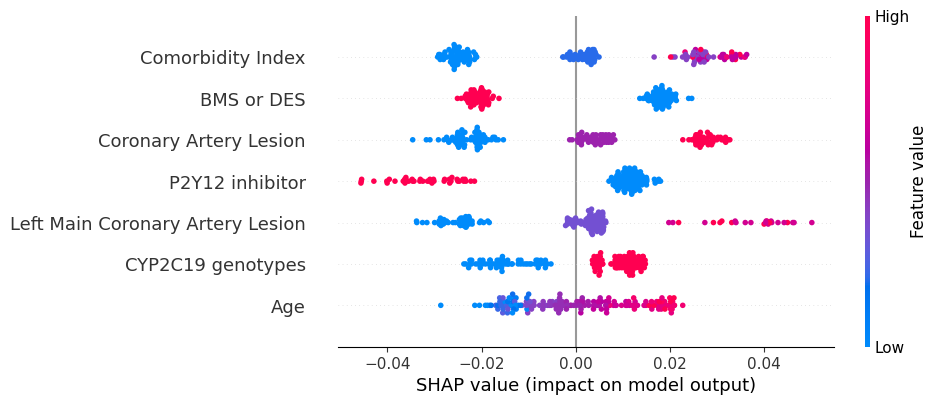

In [ ]:
shap.plots.beeswarm(exp, max_display=11)

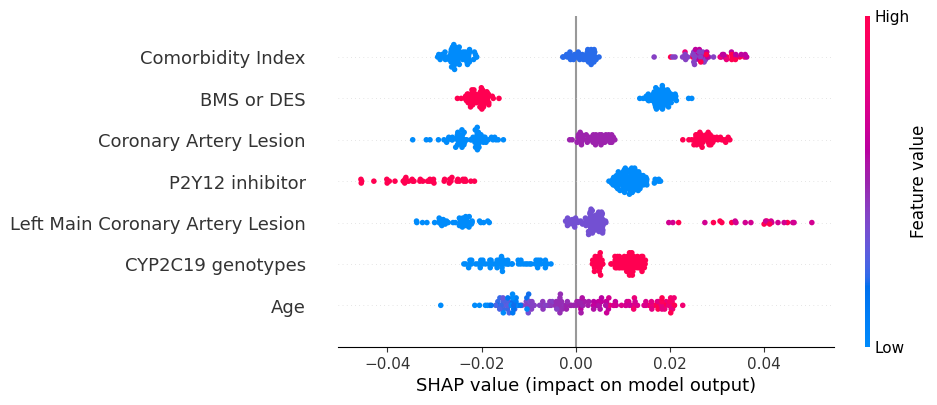

In [ ]:
explainer = shap.TreeExplainer(catboost_graphs)
shap_values = explainer.shap_values(X_train_sfs)
#plt.title("SHAP Values Plot for Catboost on features subset")
shap.plots.beeswarm(explainer(X_train_sfs), max_display=11)

Absolute

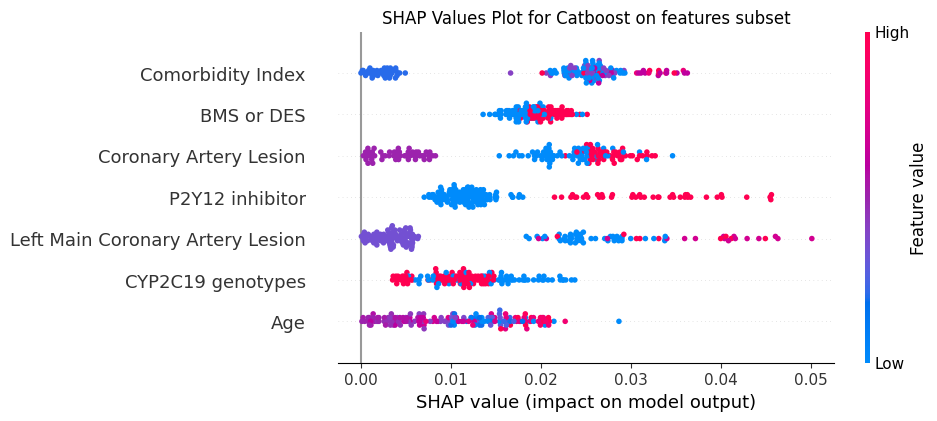

In [ ]:
plt.title("SHAP Values Plot for Catboost on features subset")
shap.plots.beeswarm(explainer(X_train_sfs).abs,max_display=11)

One-sided

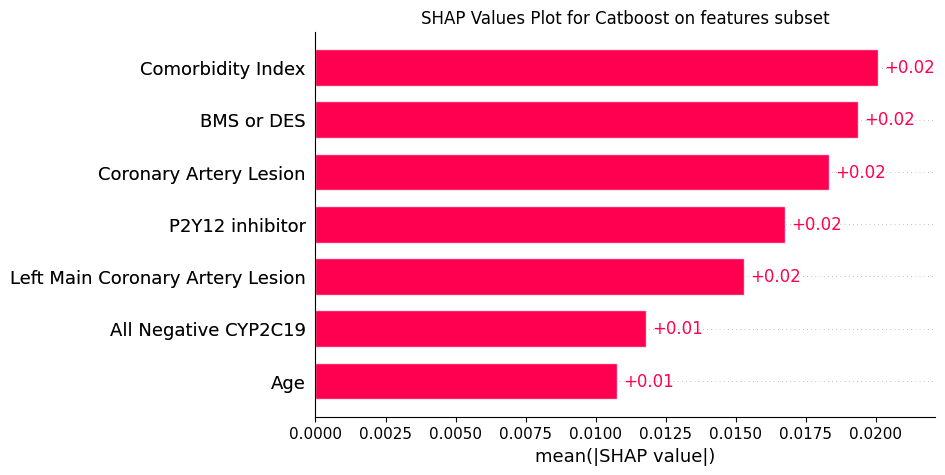

In [ ]:
plt.title("SHAP Values Plot for Catboost on features subset")
shap.plots.bar(explainer(X_train_sfs).abs.mean(0),max_display=11)

Max Risk

In [ ]:
probs = catboost_graphs.predict_proba(X_train_sfs)[:,1]
min_index = np.argmin(probs)
max_index = np.argmax(probs)

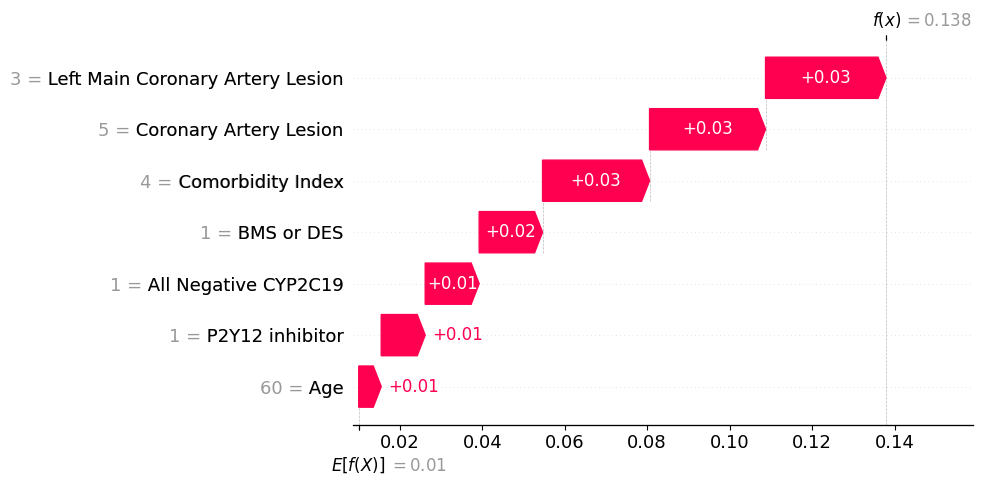

In [ ]:
shap.plots.waterfall(explainer(X_train_sfs)[max_index],max_display=11)

Min Risk

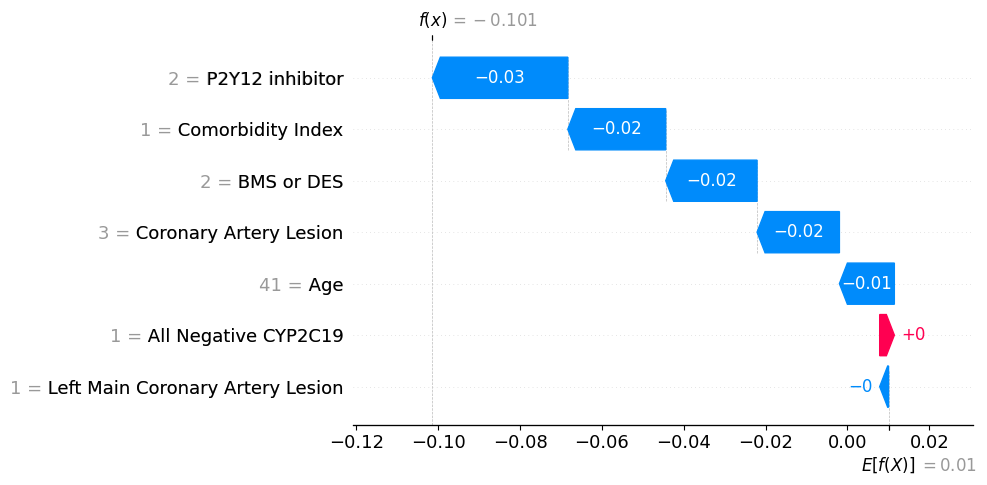

In [ ]:
shap.plots.waterfall(explainer(X_train_sfs)[min_index],max_display=11)

In [ ]:
shap.plots.initjs()
shap.plots.force(explainer(X_train_sfs)[max_index],link='logit')

In [ ]:
shap.plots.initjs()
shap.plots.force(explainer(X_train_sfs)[min_index],link='logit')

### Custom shap

In [ ]:
probs = catboost_graphs.predict_proba(X_train_sfs)[:,1]
min_index = np.argmin(probs)
max_index = np.argmax(probs)

In [ ]:
max_index

23

In [ ]:
min_index

101

In [ ]:
explainer = shap.TreeExplainer(catboost_graphs)

In [ ]:
import math
def sigmoid(x):
  return 1 / (1 + math.exp(-x))

In [ ]:
def convert_shaps_to_probs(shap_values, expected_value, proba):
  return np.asarray(shap_values)/np.sum(shap_values) * (proba - sigmoid(expected_value)), sigmoid(expected_value)

In [ ]:
def make_plot(data, index, feature_values, feature_names, display=20):
  probs = catboost_graphs.predict_proba(data)[:,1]
  exp_for_plot = explainer(data)
  values, exp_value = convert_shaps_to_probs(exp_for_plot[index].values,exp_for_plot[index].base_values,probs[index])
  values = np.asarray(values)
  values[values==0.] = 0.
  exp = shap.Explanation(values,
                  exp_value,
                  data=feature_values,
                  feature_names=data.columns)
  return waterfall(exp,max_display=display)


In [ ]:
right_values = np.asarray(['Overweighted Patient (BMI = 28 kg/m2)','High Charlson Comorbidity Index (Score 4)',
                           'Multivessel','High Intensity Dosage','Male',
                           'Involved','Critical (> 50%)','PCI',
                           'LoF or GoF'
                           ])

In [ ]:
right_feature_names

array(['Age', 'All Negative CYP2C19', 'BMS or DES', 'Comorbidity Index',
       'Coronary Artery Lesion', 'Left Main Coronary Artery Lesion',
       'P2Y12 inhibitor'], dtype=object)

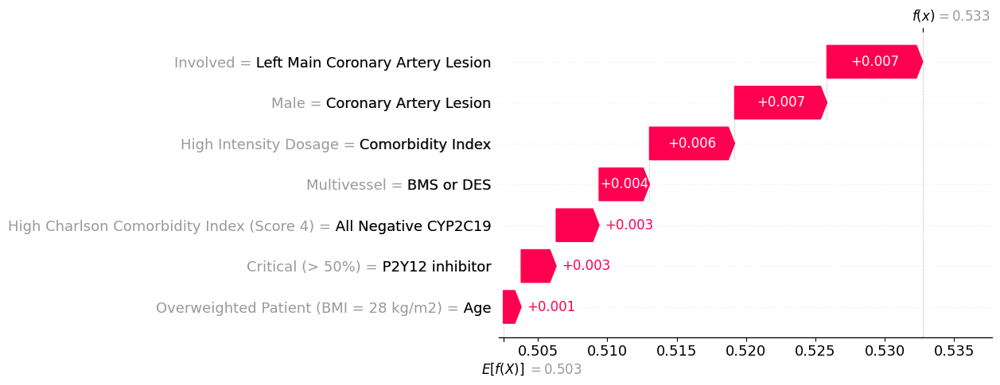

In [ ]:
make_plot(X_train_sfs,max_index ,right_values, right_feature_names,11)

In [ ]:
right_values = np.asarray(['Normal body weight (BMI = 24 kg/m2)','Low Charlson Comorbidity Index (Score 1)',
                           'One-Vessel','High Intensity Dosage','Male',
                           'Non-Involved','Critical (> 50%)','CABG',
                           'LoF or GoF'
                           ])

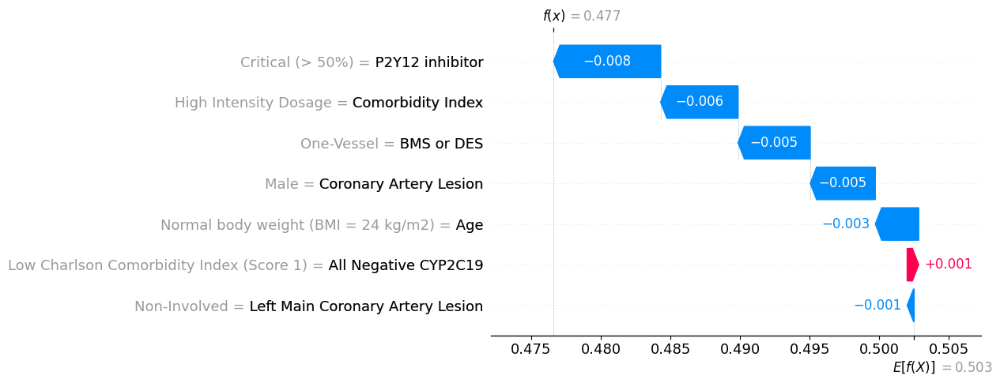

In [ ]:
make_plot(X_train_sfs,min_index,right_values, right_feature_names,11)

In [ ]:
for i in np.arange(len(probs))[(probs > 0.99) & (y_train == 1)][:10]:
  make_plot(X_train_sfs,i,True)

In [ ]:
for i in np.arange(len(probs))[probs < 0.01]:
  make_plot(X_train_sfs,i,True)

## General

In [ ]:
res_for_graph = res.round(3).sort_values(by=['ROC_AUC','PR_AUC'],ascending=False)

In [ ]:
res = pd.DataFrame()
res['model_name'] = res_for_graph.index.values
res['ROC_AUC'] = res_for_graph['ROC_AUC'].values
res['models'] = ['Conventional','AutoMl Baseline','Conventional','Conventional','Conventional','Conventional']

In [ ]:
fig = px.bar(res,
                   y='model_name',
                   x='ROC_AUC',
                   #title='Model Comparison by AUROC',
                  #color = 'models',
                   text='ROC_AUC',
                   labels={'table_name': 'Dataset', 'ROC_AUC': 'AUROC', 'model_name': 'Model'})
# Add ROC AUC values inside bins
fig.update_traces(marker_line_width=0.5, textposition='inside', texttemplate='%{text:.3f}',textfont=dict(color='black'))

# Remove axis and legend inscriptions
fig.update_xaxes(title_text='')
fig.update_yaxes(title_text='')
fig.update_layout(legend_title_text='', yaxis={'categoryorder':'total ascending'})

# Update axis labels
fig.update_layout(yaxis_title='Model Names', xaxis_title='AUROC')
# Show the plot
fig.show()

## Roc Auc Distributions

In [ ]:
cat_features = categorical

In [ ]:
X_train = imputed_train[sorted(imputed_train.columns)].copy()
X_test = imputed_test[sorted(imputed_train.columns)].copy()
X_train[cat_features] = X_train[cat_features].astype(int)
X_test[cat_features] = X_test[cat_features].astype(int)

In [ ]:
def evaluate_metrics_scores(classifiers, X_test, y_test, num_bootstrap=1000, random_state=random_state):
    metrics = ['ROC_AUC']
    results = {}
    for clf_name, clf in classifiers.items():
        metric_scores = []
        for i in range(num_bootstrap):
            # Initialize random number generator
            rng = np.random.default_rng(random_state + i)
            # Bootstrap resampling
            num_samples = len(X_test)
            bootstrap_indices = rng.choice(num_samples, num_samples, replace=True)
            X_bootstrap = X_test.iloc[bootstrap_indices]
            y_bootstrap = y_test.iloc[bootstrap_indices]
            # Handle the case when only one class is present in y_bootstrap
            if len(np.unique(y_bootstrap)) == 1:
                continue
            if clf_name!='SVM':
              # Predict probabilities
              y_prob = clf.predict_proba(X_bootstrap)[:, 1]
            else:
              y_prob = clf.predict(X_bootstrap)
            roc_auc = roc_auc_score(y_bootstrap, y_prob)
            metric_scores.append(roc_auc)
        metric_scores = np.array(metric_scores)
    return metric_scores

In [ ]:
%%capture

classifiers = {
    'Catboost' : catboost
}
cat = evaluate_metrics_scores(classifiers,X_test,y_test)

classifiers = {
    'LightGBM after Feature Selection' : catboost_selected
}
selected = evaluate_metrics_scores(classifiers,X_test_sfs,y_test)
classifiers = {
    'RandomForest' : rf
}
rf_ = evaluate_metrics_scores(classifiers,X_test,y_test)
# classifiers = {
#     'Logistic Regression' : logreg
# }
# logreg_ = evaluate_metrics(classifiers,pd.DataFrame(X_processed_test),y_test)
# classifiers = {
#     'SVM' : svm
# }
# svm_ = evaluate_metrics(classifiers,X_test,y_test)
classifiers = {
    'AutoMl Baseline' : baseline
}
automl = evaluate_metrics_scores(classifiers,X_test,y_test)
classifiers = {
    'LightGBM' : lgbm_model
}
lgbm_ = evaluate_metrics_scores(classifiers,X_test,y_test)
classifiers = {
    'DecisionTreeClassifier on CYP2C19 + P2Y12' : catboost_2_features
}
catboost_categorical_2 = evaluate_metrics_scores(classifiers,X_test_2,y_test)
classifiers = {
    'Catboost after Feature Selection' : catboost_sfs
}
catboost_sfs_ = evaluate_metrics_scores(classifiers,X_test_3,y_test)

In [ ]:
distributions = {'LightGBM after Feature Selection': selected,
                 'Catboost': cat,
                 'DecisionTreeClassifier on CYP2C19 + P2Y12' : catboost_categorical_2,
                 #'AutoMl Baseline' : automl,
                 'RandomForest' : rf_,
                 'LightGBM' : lgbm_,
                 'Catboost after Feature Selection':catboost_sfs_,
                 }

In [ ]:
distributions['LightGBM after Feature Selection']

array([0.49857143, 0.7102122 , 0.74007937, 0.70634921, 0.648     ,
       0.7234748 , 0.74801587, 0.77851459, 0.69157609, 0.55820106,
       0.67      , 0.63844086, 0.64153439, 0.8172043 , 0.68700265,
       0.62698413, 0.78168044, 0.68951613, 0.69607843, 0.60648148,
       0.62925697, 0.72281167, 0.5611413 , 0.65939153, 0.73872679,
       0.69565217, 0.53435673, 0.67730978, 0.64880952, 0.668     ,
       0.8207672 , 0.664     , 0.76766304, 0.64323607, 0.59666667,
       0.54      , 0.62830688, 0.65915119, 0.6547619 , 0.68849206,
       0.72666667, 0.704     , 0.73806366, 0.5248538 , 0.68817204,
       0.74488304, 0.57866667, 0.75933333, 0.82758621, 0.75770308,
       0.640625  , 0.5210084 , 0.69972826, 0.53      , 0.74005305,
       0.62301587, 0.77341598, 0.63624339, 0.73857143, 0.79177719,
       0.7173913 , 0.74137931, 0.74388587, 0.82228117, 0.67934783,
       0.64285714, 0.74403183, 0.67391304, 0.69733333, 0.7234748 ,
       0.60685484, 0.73142857, 0.7255291 , 0.71693122, 0.58870

In [ ]:
# Create a Plotly horizontal boxplot
fig = px.box(pd.DataFrame().from_dict(distributions, orient = 'index').T,
            orientation='h')#, title='Comparison of ROC AUC Distributions for Different Models')
# Remove axis and legend inscriptions
fig.update_xaxes(title_text='')
fig.update_yaxes(title_text='')
fig.update_layout(legend_title_text='', yaxis={'categoryorder':'total ascending'})

# Update axis labels
fig.update_layout(yaxis_title='Model Names', xaxis_title='AUROC')
# Show the plot
fig.show()

In [ ]:
# Create a Plotly horizontal boxplot
fig = px.box(pd.DataFrame().from_dict(distributions, orient = 'index').T,
            orientation='h', title='Comparison of ROC AUC Distributions for Different Models',width=1200, height=1200)
# Remove axis and legend inscriptions
fig.update_xaxes(title_text='')
fig.update_yaxes(title_text='')
fig.update_layout(legend_title_text='', yaxis={'categoryorder':'total ascending'})

# Update axis labels
fig.update_layout(yaxis_title='Model Names', xaxis_title='AUROC')
# Show the plot
fig.show()

# Calibrated

In [ ]:
from sklearn.calibration import CalibratedClassifierCV
calib = CalibratedClassifierCV(base_estimator=catboost_graphs, method='sigmoid', cv=20)
calib.fit(X_train_sfs,y_train)

Выходные данные были обрезаны до нескольких последних строк (5000).
0:	learn: 0.6930853	total: 1.2ms	remaining: 597ms
1:	learn: 0.6930406	total: 2.8ms	remaining: 697ms
2:	learn: 0.6929986	total: 4.22ms	remaining: 699ms
3:	learn: 0.6929230	total: 5.52ms	remaining: 685ms
4:	learn: 0.6928948	total: 6.68ms	remaining: 661ms
5:	learn: 0.6928456	total: 7.91ms	remaining: 651ms
6:	learn: 0.6927933	total: 9.17ms	remaining: 646ms
7:	learn: 0.6927638	total: 10.4ms	remaining: 640ms
8:	learn: 0.6926990	total: 11.8ms	remaining: 643ms
9:	learn: 0.6926226	total: 13ms	remaining: 639ms
10:	learn: 0.6925645	total: 14.2ms	remaining: 631ms
11:	learn: 0.6925074	total: 15.3ms	remaining: 623ms
12:	learn: 0.6924627	total: 16.5ms	remaining: 620ms
13:	learn: 0.6923949	total: 17.8ms	remaining: 616ms
14:	learn: 0.6923409	total: 19ms	remaining: 614ms
15:	learn: 0.6922754	total: 20.1ms	remaining: 609ms
16:	learn: 0.6922515	total: 21.5ms	remaining: 612ms
17:	learn: 0.6922137	total: 22.7ms	remaining: 609ms
18:	learn: 0

CalibratedClassifierCV(base_estimator=<catboost.core.CatBoostClassifier object at 0x7fc93c2faf80>,
                       cv=20)

In [ ]:
classifiers = {
    'Catboost' : catboost_graphs
}
cat = evaluate_metrics(classifiers,X_test_sfs,y_test)

classifiers = {
    'Calibrated' : calib
}
calibrated = evaluate_metrics(classifiers,X_test_sfs,y_test)

In [ ]:
res2 = pd.concat([cat,calibrated])
res2.round(3).sort_values(by=['ROC_AUC','PR_AUC'],ascending=False).style.highlight_max()

,PR_AUC,ROC_AUC,F1-score,Precision,Recall,MCC,Accuracy
Catboost,0.734000,0.721000,0.650000,0.592000,0.732000,0.286000,0.636000
Calibrated,0.740000,0.720000,0.628000,0.556000,0.732000,0.218000,0.599000


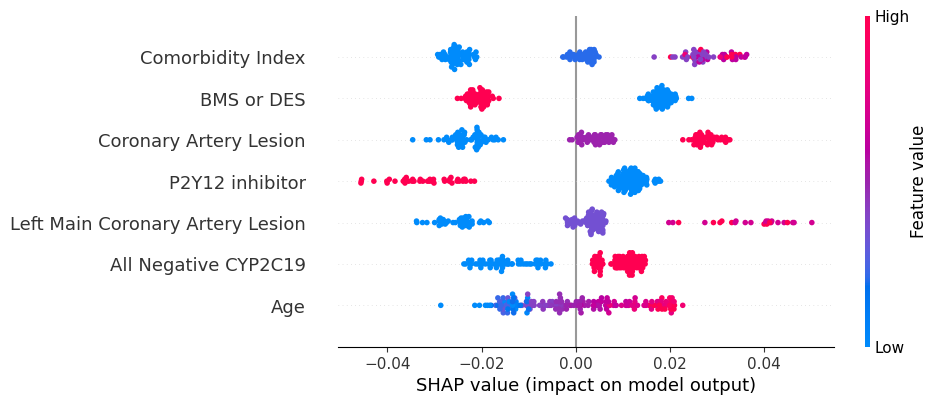

In [ ]:
explainer = shap.TreeExplainer(catboost_graphs)
shap_values = explainer.shap_values(X_train_sfs)
#plt.title("SHAP Values Plot for Catboost on features subset")
shap.plots.beeswarm(explainer(X_train_sfs), max_display=11)

### Custom shap

In [ ]:
probs = calib.predict_proba(X_train_sfs)[:,1]
probs_og = catboost_graphs.predict_proba(X_train_sfs)[:,1]
min_index = np.argmin(probs_og)
max_index = np.argmax(probs_og)

In [ ]:
max_index

23

In [ ]:
min_index

101

In [ ]:
explainer = shap.TreeExplainer(catboost_graphs)

In [ ]:
import math
def sigmoid(x):
  return 1 / (1 + math.exp(-x))

In [ ]:
def convert_shaps_to_probs(shap_values, expected_value, proba):
  return np.asarray(shap_values)/np.sum(shap_values) * (proba - sigmoid(expected_value)), sigmoid(expected_value)

In [ ]:
def make_plot(data, index, feature_values, feature_names, display=20):
  probs = calib.predict_proba(data)[:,1]
  exp_for_plot = explainer(data)
  values, exp_value = convert_shaps_to_probs(exp_for_plot[index].values,exp_for_plot[index].base_values,probs[index])
  values = np.asarray(values)
  values[values==0.] = 0.
  exp = shap.Explanation(values,
                  exp_value,
                  data=feature_values,
                  feature_names=data.columns)
  return waterfall(exp,max_display=display)


In [ ]:
right_values = np.asarray(['60','LoF or GoF','BMS','High Charlson Comorbidity Index (Score 4)',
                           'Multi-Vessel','Critical (> 50%)','Clopidogrel'
                           ])

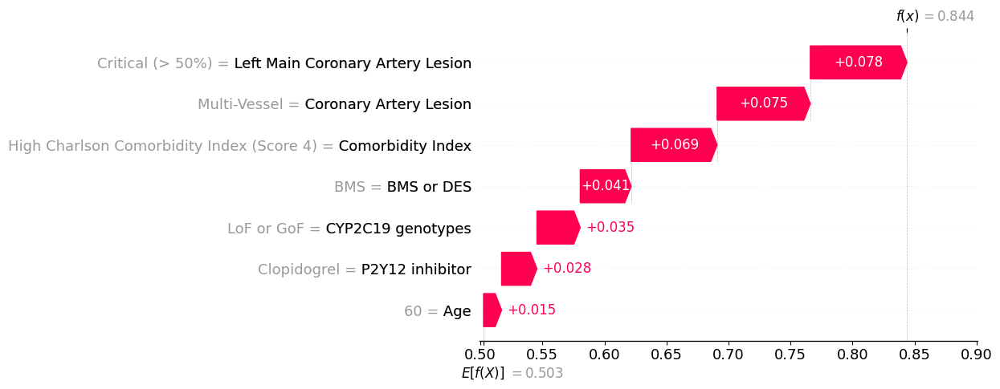

In [ ]:
make_plot(X_train_sfs,max_index ,right_values, right_feature_names,11)

In [ ]:
right_values = np.asarray(['41','LoF or GoF','DES','Low Charlson Comorbidity Index (Score 1)',
                           'One-Vessel','Non-Critical (< 50%)','Ticagrelor'
                           ])

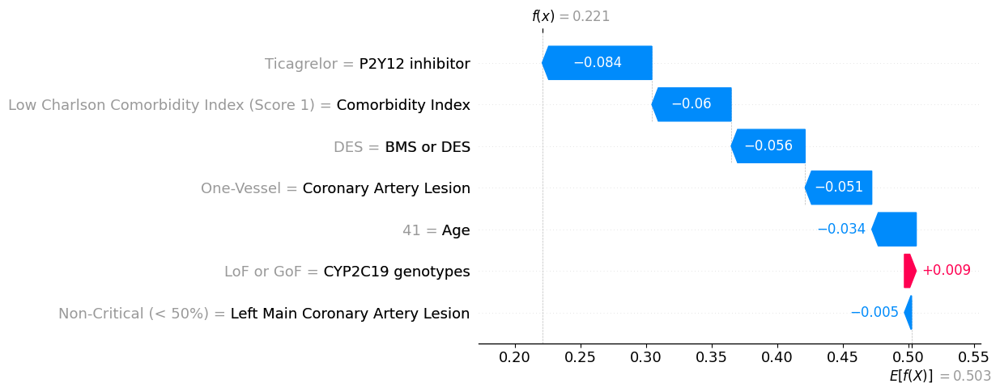

In [ ]:
make_plot(X_train_sfs,min_index ,right_values, right_feature_names,11)

Min Risk

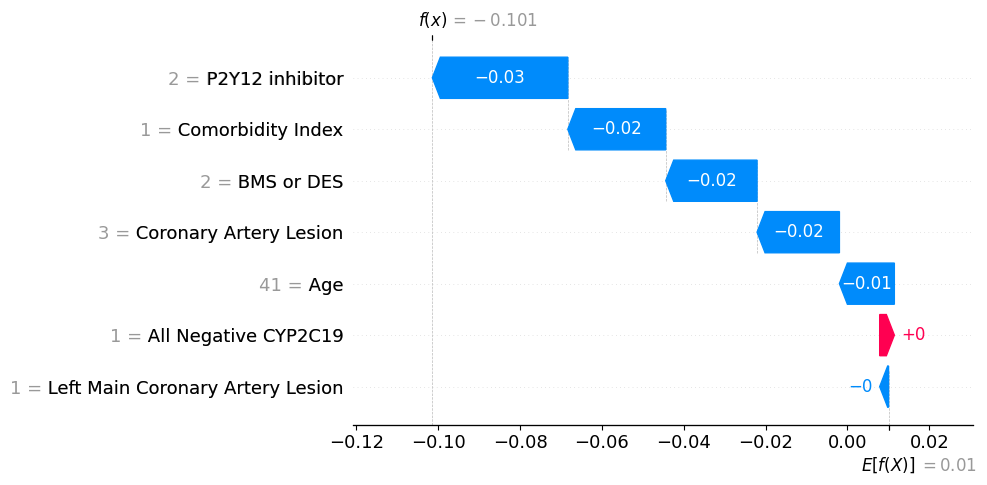

In [ ]:
shap.plots.waterfall(explainer(X_train_sfs)[min_index],max_display=11)

In [ ]:
right_values = np.asarray(['60','Altered Genotype','BMS','High Charlson Comorbidity Index (Score 4)',
                           'Multi-Vessel','Critical (> 50%)','Old'
                           ])

In [ ]:
right_feature_names

array(['Age', 'All Negative CYP2C19', 'BMS or DES', 'Comorbidity Index',
       'Coronary Artery Lesion', 'Left Main Coronary Artery Lesion',
       'P2Y12 inhibitor'], dtype=object)

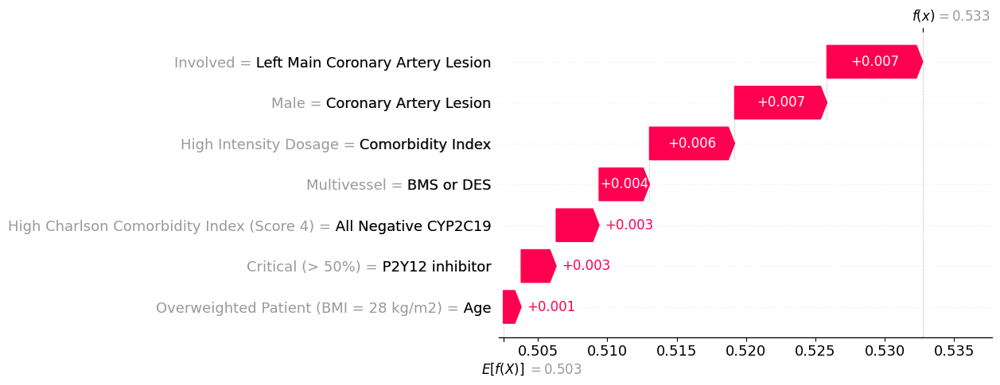

In [ ]:
make_plot(X_train_sfs,max_index ,right_values, right_feature_names,11)

In [ ]:
right_values = np.asarray(['Normal body weight (BMI = 24 kg/m2)','Low Charlson Comorbidity Index (Score 1)',
                           'One-Vessel','High Intensity Dosage','Male',
                           'Non-Involved','Critical (> 50%)','CABG',
                           'Wild (C/C)'
                           ])

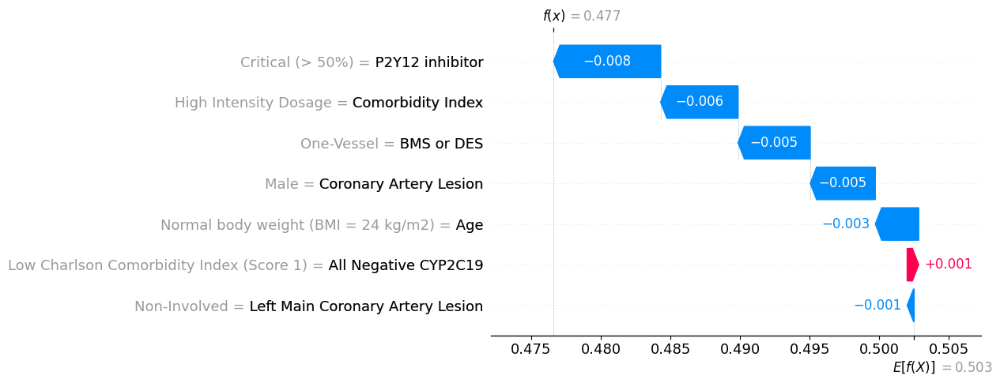

In [ ]:
make_plot(X_train_sfs,min_index,right_values, right_feature_names,11)

In [ ]:
make_plot(X_train_sfs,18,11)

TypeError: make_plot() missing 1 required positional argument: 'feature_names'

In [ ]:
for i in np.arange(len(probs))[(probs > 0.99) & (y_train == 1)][:10]:
  make_plot(X_train_sfs,i,True)

In [ ]:
for i in np.arange(len(probs))[probs < 0.01]:
  make_plot(X_train_sfs,i,True)